<a href="https://colab.research.google.com/github/IbrahimTGhanem/Datathon4/blob/main/Dathathon_04_Group_02_edited_(new).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Section 1: Introduction**

**1.1: Importing Libraries and exploring data**

In [295]:
pip install category-encoders

In [297]:
import pandas as pd
import numpy as np
import warnings
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
import seaborn as sns
import scipy.stats as stats
import matplotlib.pyplot as plt
# from sklearn.metrics import RocCurveDisplay, auc, roc_curve
from sklearn.metrics import roc_auc_score, accuracy_score
import plotly.express as px
from category_encoders import OneHotEncoder, TargetEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV


warnings.filterwarnings('ignore')

In [298]:
#additional libraries on the go, as analysis require
from scipy import stats
from scipy.stats import chi2_contingency
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from imblearn.under_sampling import RandomUnderSampler
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split, cross_val_predict
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error
from sklearn.feature_selection import RFECV
from sklearn.model_selection import StratifiedKFold
import matplotlib.gridspec as gridspec
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score, roc_curve, RocCurveDisplay
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, auc
from sklearn.metrics import make_scorer
from sklearn.linear_model import Lasso
import statsmodels.api as sm
from sklearn.tree import DecisionTreeClassifier
from sklearn.feature_selection import RFE
from collections import Counter

In [299]:
#FUNCTION TO CONNECT DATA - DEPENDING ON PERSON WORKING ON THE FILE

from google.colab import files

# Upload Options
user_choice = input("Specify user (I, K, R): ")

if user_choice == 'I':
    # Option I: Mount Google Drive - Konrad
    from google.colab import drive
    drive.mount('/content/drive')
    data = pd.read_csv("drive/My Drive/Colab Notebooks/ML 2023/Datathons/Datathon_4/datathon4.csv") #Ibrahim path File
elif user_choice == 'K':
    # Option K: Mount Google Drive - Konrad
    from google.colab import drive
    drive.mount('/content/drive')
    data = pd.read_csv("drive/My Drive/ML Course/Datathon 4/datathon4.csv") #Konrad File Path
elif user_choice == 'R':
    # Load data
    uploaded = files.upload()
    data = pd.read_csv('datathon4.csv') #Rebecca
else:
    print("Invalid choice. Please specify user (I, K, R) and try again.")


print(data.shape) # Check, Dimensions = 186 columns, 91,713 obs

Specify user (I, K, R): I
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
(91713, 186)


In [300]:
'''from google.colab import files

# Specify the path to the file on local machine
uploaded = files.upload()'''

'from google.colab import files\n\n# Specify the path to the file on local machine\nuploaded = files.upload()'

In [301]:
#data = pd.read_csv('datathon4.csv')
pd.set_option('display.max_columns', None)
data.head()

,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,readmission_status,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,urineoutput_apache,ventilated_apache,wbc_apache,d1_diasbp_invasive_max,d1_diasbp_invasive_min,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_invasive_max,d1_mbp_invasive_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_invasive_max,d1_sysbp_invasive_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_invasive_max,h1_mbp_invasive_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_invasive_max,h1_sysbp_invasive_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_albumin_max,d1_albumin_min,d1_bilirubin_max,d1_bilirubin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_inr_max,d1_inr_min,d1_lactate_max,d1_lactate_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,h1_albumin_max,h1_albumin_min,h1_bilirubin_max,h1_bilirubin_min,h1_bun_max,h1_bun_min,h1_calcium_max,h1_calcium_min,h1_creatinine_max,h1_creatinine_min,h1_glucose_max,h1_glucose_min,h1_hco3_max,h1_hco3_min,h1_hemaglobin_max,h1_hemaglobin_min,h1_hematocrit_max,h1_hematocrit_min,h1_inr_max,h1_inr_min,h1_lactate_max,h1_lactate_min,h1_platelets_max,h1_platelets_min,h1_potassium_max,h1_potassium_min,h1_sodium_max,h1_sodium_min,h1_wbc_max,h1_wbc_min,d1_arterial_pco2_max,d1_arterial_pco2_min,d1_arterial_ph_max,d1_arterial_ph_min,d1_arterial_po2_max,d1_arterial_po2_min,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,h1_arterial_pco2_min,h1_arterial_ph_max,h1_arterial_ph_min,h1_arterial_po2_max,h1_arterial_po2_min,h1_pao2fio2ratio_max,h1_pao2fio2ratio_min,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,66154,25312,118,0,68.0,22.73,0,Caucasian,M,180.3,Floor,Floor,92,admit,CTICU,0.541667,0,73.9,2.3,113.0,502.01,0,0.0,0.4,31.0,2.51,NaN,3.0,6.0,0.0,4.0,168.0,118.0,27.4,0.0,40.0,NaN,NaN,NaN,NaN,36.0,134.0,39.3,NaN,0.0,14.1,46.0,32.0,68.0,37.0,68.0,37.0,119.0,72.0,66.0,40.0,89.0,46.0,89.0,46.0,34.0,10.0,100.0,74.0,122.0,64.0,131.0,73.0,131.0,73.0,39.9,37.2,NaN,NaN,68.0,63.0,68.0,63.0,119.0,108.0,NaN,NaN,86.0,85.0,86.0,85.0,26.0,18.0,100.0,74.0,NaN,NaN,131.0,115.0,131.0,115.0,39.5,37.5,2.3,2.3,0.4,0.4,31.0,30.0,8.5,7.4,2.51,2.23,168.0,109.0,19.0,15.0,8.9,8.9,27.4,27.4,NaN,NaN,1.3,1.0,233.0,233.0,4.0,3.4,136.0,134.0,14.1,14.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.10,0.05,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
1,114252,59342,81,0,77.0,27.42,0,Caucasian,F,160.0,Floor,Floor,90,admit,Med-Surg ICU,0.927778,0,70.2,NaN,1

**1.2: Process of omitting hospital-admin-related columns (ensuring high data quality)**

It is important examine variables and identify/drop irrelevant columns (i.e. identifiers/administrative data) and variables with a single value or with significant level of missing values. The threshold for that will be set at 20%, based on findings from literature:
Peng CYJ, Harwell M, Liou SM, Ehman LH. Advances in missing data methods and implications for educational research. In: Sawilowsky SS, editor. Real data analysis. Charlotte, North Carolina: Information Age Pub; 2006. pp. 31–78.

In [302]:
#Dropping identifiers
identifiers_to_drop = ['encounter_id', 'hospital_id', 'patient_id', 'icu_id']
data = data.drop(columns=identifiers_to_drop)

In [303]:
#Dropping ALACHE Death Prediction Scores - since we want to develop our own model
apache_to_drop = ['apache_4a_hospital_death_prob', 'apache_4a_icu_death_prob'] #there is no pred variable
data = data.drop(columns=apache_to_drop)

In [304]:
#dropping administrative columns
admins_to_drop = ['hospital_admit_source', 'icu_admit_source', 'icu_stay_type', 'icu_type']
data = data.drop(columns=admins_to_drop)

single-value columns will not add value to any prediction models. In fact, it might represent noise in models

In [305]:
# Creating an empty list to store the names of columns with a single value
single_value_columns = []

# Iterating through the columns
for column in data.columns:
    if data[column].nunique() == 1:
        single_value_columns.append(column)

# Printing the list of columns with a single value
print("Columns with a single value for all observations:")
print(single_value_columns)

Columns with a single value for all observations:
['readmission_status']


In [306]:
#dropping single values columns as they may impact the analysis
data = data.drop(columns=single_value_columns)

Also, after examining variables closely it appears that over the column of pre_icu_los_days has around 750 of negative values. This variable represents the length of stay of a patient between hospital admission and unit admission. Yet, having negative values indicates a data quality aspect. Thus, this variable will be removed from analysis

In [307]:
low_quality_variable = ['pre_icu_los_days']
data = data.drop(columns=low_quality_variable)

In [308]:
#Describing data after omitting variables
description = data.describe()
description

,hospital_death,age,bmi,elective_surgery,height,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,urineoutput_apache,ventilated_apache,wbc_apache,d1_diasbp_invasive_max,d1_diasbp_invasive_min,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_invasive_max,d1_mbp_invasive_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_invasive_max,d1_sysbp_invasive_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_invasive_max,h1_mbp_invasive_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_invasive_max,h1_sysbp_invasive_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_albumin_max,d1_albumin_min,d1_bilirubin_max,d1_bilirubin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_inr_max,d1_inr_min,d1_lactate_max,d1_lactate_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,h1_albumin_max,h1_albumin_min,h1_bilirubin_max,h1_bilirubin_min,h1_bun_max,h1_bun_min,h1_calcium_max,h1_calcium_min,h1_creatinine_max,h1_creatinine_min,h1_glucose_max,h1_glucose_min,h1_hco3_max,h1_hco3_min,h1_hemaglobin_max,h1_hemaglobin_min,h1_hematocrit_max,h1_hematocrit_min,h1_inr_max,h1_inr_min,h1_lactate_max,h1_lactate_min,h1_platelets_max,h1_platelets_min,h1_potassium_max,h1_potassium_min,h1_sodium_max,h1_sodium_min,h1_wbc_max,h1_wbc_min,d1_arterial_pco2_max,d1_arterial_pco2_min,d1_arterial_ph_max,d1_arterial_ph_min,d1_arterial_po2_max,d1_arterial_po2_min,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,h1_arterial_pco2_min,h1_arterial_ph_max,h1_arterial_ph_min,h1_arterial_po2_max,h1_arterial_po2_min,h1_pao2fio2ratio_max,h1_pao2fio2ratio_min,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis
count,91713.000000,87485.000000,88284.000000,91713.000000,90379.000000,88993.000000,37334.000000,90051.000000,90612.000000,91713.000000,90998.000000,33579.000000,72451.00000,72860.000000,20845.000000,89812.000000,89812.000000,90676.000000,89812.000000,80677.000000,90835.000000,71835.000000,90998.000000,90719.000000,20845.000000,20845.000000,20845.000000,20845.000000,90479.000000,73113.000000,87605.000000,42715.000000,90998.000000,69701.000000,23729.000000,23729.000000,91548.000000,91548.000000,90673.000000,90673.000000,91568.000000,91568.000000,23936.000000,23936.000000,91493.000000,91493.000000,90234.000000,90234.000000,91328.000000,91328.000000,91380.000000,91380.000000,23754.000000,23754.000000,91554.000000,91554.00000,90686.000000,90686.000000,89389.000000,89389.000000,16785.000000,16785.000000,88094.000000,88094.000000,84363.000000,84363.000000,88923.000000,88923.000000,16869.000000,16869.000000,87074.000000,87074.000000,82629.000000,82629.000000,87356.000000,87356.000000,87528.000000,87528.000000,16798.000000,16798.000000,88102.000000,88102.000000,84372.000000,84372.000000,69981.000000,69981.000000,42617.000000,42617.000000,38040.000000,38040.000000,81199.000000,81199.000000,78644.000000,78644.000000,81544.000000

**Section 2: Data Engineering Process**

**2.1: Visualizing the distribution of missing values and omitting variables with missing values that is above 20%**

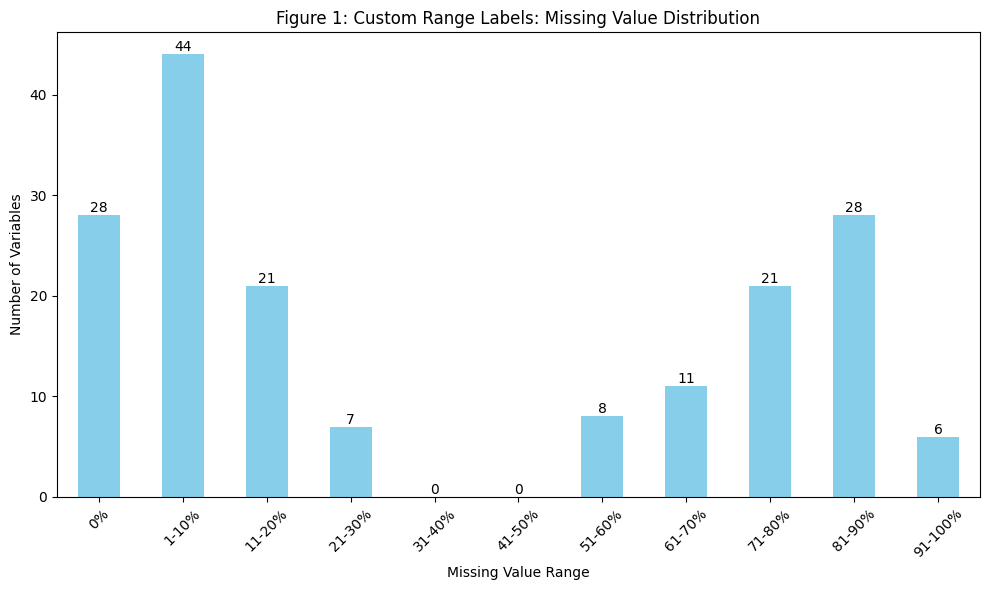

In [309]:
# Calculating the percentage of missing values in each column
missing_percentage = (data.isnull().mean() * 100)

# Defining custom range for bars
custom_labels = ['0%', '1-10%', '11-20%', '21-30%', '31-40%', '41-50%', '51-60%', '61-70%', '71-80%', '81-90%', '91-100%']

# Defining the range thresholds for bars
ranges = [0, 1, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]

# Creating a dictionary to count variables in each range
range_counts = {custom_labels[i]: ((missing_percentage >= start) & (missing_percentage < end)).sum() for i, (start, end) in enumerate(zip(ranges, ranges[1:]))}

# Converting the dictionary to a DataFrame for plotting
range_counts_df = pd.DataFrame.from_dict(range_counts, orient='index', columns=['Count'])

# Plotting the bar chart
plt.figure(figsize=(10, 6))
ax = range_counts_df.plot(kind='bar', ax=plt.gca(), color='skyblue', legend=False)
plt.xlabel("Missing Value Range")
plt.ylabel("Number of Variables")
plt.title("Figure 1: Custom Range Labels: Missing Value Distribution")
plt.xticks(rotation=45)

# Adding count labels to the bars
for i, v in enumerate(range_counts_df['Count']):
    ax.text(i, v, str(v), ha='center', va='bottom')

plt.tight_layout()
plt.show()

In [310]:
# Setting the threshold for the percentage of missing values
missing_threshold = 20  # 20% or more missing values

# Filtering columns with missing values exceeding the threshold
columns_with_high_missing = missing_percentage[missing_percentage > missing_threshold]

# Listing the columns with more than 20% missing values
print("Columns with more than 20% missing values:")
print(columns_with_high_missing.index.tolist())

Columns with more than 20% missing values:
['albumin_apache', 'bilirubin_apache', 'bun_apache', 'creatinine_apache', 'fio2_apache', 'hematocrit_apache', 'paco2_apache', 'paco2_for_ph_apache', 'pao2_apache', 'ph_apache', 'sodium_apache', 'urineoutput_apache', 'wbc_apache', 'd1_diasbp_invasive_max', 'd1_diasbp_invasive_min', 'd1_mbp_invasive_max', 'd1_mbp_invasive_min', 'd1_sysbp_invasive_max', 'd1_sysbp_invasive_min', 'h1_diasbp_invasive_max', 'h1_diasbp_invasive_min', 'h1_mbp_invasive_max', 'h1_mbp_invasive_min', 'h1_sysbp_invasive_max', 'h1_sysbp_invasive_min', 'h1_temp_max', 'h1_temp_min', 'd1_albumin_max', 'd1_albumin_min', 'd1_bilirubin_max', 'd1_bilirubin_min', 'd1_inr_max', 'd1_inr_min', 'd1_lactate_max', 'd1_lactate_min', 'h1_albumin_max', 'h1_albumin_min', 'h1_bilirubin_max', 'h1_bilirubin_min', 'h1_bun_max', 'h1_bun_min', 'h1_calcium_max', 'h1_calcium_min', 'h1_creatinine_max', 'h1_creatinine_min', 'h1_glucose_max', 'h1_glucose_min', 'h1_hco3_max', 'h1_hco3_min', 'h1_hemaglobi

In [311]:
count_of_high_missing_columns = len(columns_with_high_missing)
print("Count of columns with more than 20% missing values:", count_of_high_missing_columns)

Count of columns with more than 20% missing values: 81


In [312]:
#dropping variables with significant level of missing values
High_missing_values_to_drop = ['albumin_apache', 'bilirubin_apache', 'bun_apache', 'creatinine_apache', 'fio2_apache', 'hematocrit_apache', 'paco2_apache', 'paco2_for_ph_apache', 'pao2_apache', 'ph_apache', 'sodium_apache', 'urineoutput_apache', 'wbc_apache', 'd1_diasbp_invasive_max', 'd1_diasbp_invasive_min', 'd1_mbp_invasive_max', 'd1_mbp_invasive_min', 'd1_sysbp_invasive_max', 'd1_sysbp_invasive_min', 'h1_diasbp_invasive_max', 'h1_diasbp_invasive_min', 'h1_mbp_invasive_max', 'h1_mbp_invasive_min', 'h1_sysbp_invasive_max', 'h1_sysbp_invasive_min', 'h1_temp_max', 'h1_temp_min', 'd1_albumin_max', 'd1_albumin_min', 'd1_bilirubin_max', 'd1_bilirubin_min', 'd1_inr_max', 'd1_inr_min', 'd1_lactate_max', 'd1_lactate_min', 'h1_albumin_max', 'h1_albumin_min', 'h1_bilirubin_max', 'h1_bilirubin_min', 'h1_bun_max', 'h1_bun_min', 'h1_calcium_max', 'h1_calcium_min', 'h1_creatinine_max', 'h1_creatinine_min', 'h1_glucose_max', 'h1_glucose_min', 'h1_hco3_max', 'h1_hco3_min', 'h1_hemaglobin_max', 'h1_hemaglobin_min', 'h1_hematocrit_max', 'h1_hematocrit_min', 'h1_inr_max', 'h1_inr_min', 'h1_lactate_max', 'h1_lactate_min', 'h1_platelets_max', 'h1_platelets_min', 'h1_potassium_max', 'h1_potassium_min', 'h1_sodium_max', 'h1_sodium_min', 'h1_wbc_max', 'h1_wbc_min', 'd1_arterial_pco2_max', 'd1_arterial_pco2_min', 'd1_arterial_ph_max', 'd1_arterial_ph_min', 'd1_arterial_po2_max', 'd1_arterial_po2_min', 'd1_pao2fio2ratio_max', 'd1_pao2fio2ratio_min', 'h1_arterial_pco2_max', 'h1_arterial_pco2_min', 'h1_arterial_ph_max', 'h1_arterial_ph_min', 'h1_arterial_po2_max', 'h1_arterial_po2_min', 'h1_pao2fio2ratio_max', 'h1_pao2fio2ratio_min']
data = data.drop(columns=High_missing_values_to_drop)

In [313]:
# Checking for missing values
missing_value_counts = data.isnull().sum()
total_entries = len(data)

# Print the missing value counts and percentages for each column
for column, count in missing_value_counts.items():
    percentage_missing = (count / total_entries) * 100
    print(f"{column}: {count} missing values ({percentage_missing:.2f}% of total)")

hospital_death: 0 missing values (0.00% of total)
age: 4228 missing values (4.61% of total)
bmi: 3429 missing values (3.74% of total)
elective_surgery: 0 missing values (0.00% of total)
ethnicity: 1395 missing values (1.52% of total)
gender: 25 missing values (0.03% of total)
height: 1334 missing values (1.45% of total)
weight: 2720 missing values (2.97% of total)
apache_2_diagnosis: 1662 missing values (1.81% of total)
apache_3j_diagnosis: 1101 missing values (1.20% of total)
apache_post_operative: 0 missing values (0.00% of total)
arf_apache: 715 missing values (0.78% of total)
gcs_eyes_apache: 1901 missing values (2.07% of total)
gcs_motor_apache: 1901 missing values (2.07% of total)
gcs_unable_apache: 1037 missing values (1.13% of total)
gcs_verbal_apache: 1901 missing values (2.07% of total)
glucose_apache: 11036 missing values (12.03% of total)
heart_rate_apache: 878 missing values (0.96% of total)
intubated_apache: 715 missing values (0.78% of total)
map_apache: 994 missing valu

In [314]:
# Printing the dimension of the dataset
print(data.shape)

(91713, 93)


In [315]:
variables_list = data.columns.tolist()

# Printing the list of variables
print("List of Variables:")
for variable in variables_list:
    print(variable)

List of Variables:
hospital_death
age
bmi
elective_surgery
ethnicity
gender
height
weight
apache_2_diagnosis
apache_3j_diagnosis
apache_post_operative
arf_apache
gcs_eyes_apache
gcs_motor_apache
gcs_unable_apache
gcs_verbal_apache
glucose_apache
heart_rate_apache
intubated_apache
map_apache
resprate_apache
temp_apache
ventilated_apache
d1_diasbp_max
d1_diasbp_min
d1_diasbp_noninvasive_max
d1_diasbp_noninvasive_min
d1_heartrate_max
d1_heartrate_min
d1_mbp_max
d1_mbp_min
d1_mbp_noninvasive_max
d1_mbp_noninvasive_min
d1_resprate_max
d1_resprate_min
d1_spo2_max
d1_spo2_min
d1_sysbp_max
d1_sysbp_min
d1_sysbp_noninvasive_max
d1_sysbp_noninvasive_min
d1_temp_max
d1_temp_min
h1_diasbp_max
h1_diasbp_min
h1_diasbp_noninvasive_max
h1_diasbp_noninvasive_min
h1_heartrate_max
h1_heartrate_min
h1_mbp_max
h1_mbp_min
h1_mbp_noninvasive_max
h1_mbp_noninvasive_min
h1_resprate_max
h1_resprate_min
h1_spo2_max
h1_spo2_min
h1_sysbp_max
h1_sysbp_min
h1_sysbp_noninvasive_max
h1_sysbp_noninvasive_min
d1_bun_max

**2.2 Exploration of variables with low variability**

In addition to exploring and omitting columns with no variability in the response, and columns with missing data >20%, we performed 1 way cross-tabulations to look for cases where there is a low variability within a column. Data with low variability (e.g., n=90,000 for category 1, and n=5 for category 2) may warrant exclusion. For this analyis, given the class imblanace in the label, we will set the threshold to 10 observations for each category.

In [318]:
#Perform 1 way cross tabulations to explore variability in data

single_category_threshold = 95

# Initialize an empty list to store columns with low variability
low_variability_columns = []

# Iterate through each column in the DataFrame
for column in data.columns:
    # Exclude missing values and calculate the percentage for each category
    category_percentages = data[column].value_counts(normalize=True, dropna=True) * 100

    #Calculate total count
    total_count = data[column].count()
    percentage_missing = (1-(total_count/91713))

    # Check if more than 95% of the non-missing data is of a single category
    if category_percentages.max() > single_category_threshold:
        low_variability_columns.append((column, category_percentages.max()))

    # Print the results
    print(f"Column: {column}")
    print("Category Percentages:")
    print(category_percentages)
    print(f"Total count of non-missing: {total_count}")
    print(f"Percentage Missing: {percentage_missing}")
    print("\n")

# Print the list of columns with low variability after finishing the loop
print(f"Columns where more than {single_category_threshold}% of non-missing data is of a single category:")
for column, percentage in low_variability_columns:
    print(f"{column}: {percentage:.2f}%")

Column: hospital_death
Category Percentages:
0    91.369817
1     8.630183
Name: hospital_death, dtype: float64
Total count of non-missing: 91713
Percentage Missing: 0.0


Column: age
Category Percentages:
67.0    2.595874
68.0    2.483854
71.0    2.447277
72.0    2.411842
66.0    2.353546
          ...   
19.0    0.392067
20.0    0.386352
18.0    0.296051
17.0    0.144025
16.0    0.050294
Name: age, Length: 74, dtype: float64
Total count of non-missing: 87485
Percentage Missing: 0.046100334739895055


Column: bmi
Category Percentages:
14.844926    0.501790
67.814990    0.478003
24.017768    0.098546
24.208110    0.097413
27.359332    0.092882
               ...   
61.796764    0.001133
23.241435    0.001133
26.130528    0.001133
24.463976    0.001133
47.179671    0.001133
Name: bmi, Length: 34888, dtype: float64
Total count of non-missing: 88284
Percentage Missing: 0.03738837460338229


Column: elective_surgery
Category Percentages:
0    81.626378
1    18.373622
Name: elective_surgery

While aids may have a lower variability compared to other columns, we decided it to keep it (for ethical and bias reasons, it may be important to include). We discussed and decided to include all variables flagged at this threshold

**2.3 Examination of the association between hospital death event and missing values in categorical, integer, and binary variables.**

Types of variables were obtained from the data dictionary sheet

In [319]:
# Listing of categorical variables
categorical_variables_1 = ['apache_3j_bodysystem', 'apache_2_bodysystem', 'ethnicity', 'gender']

# Binary label variable
binary_label = 'hospital_death'

# Creating a function to apply a chi-squared test and check for association
def chi_squared_test(data, categorical_variables_1, binary_label):
    contingency_table = pd.crosstab(data[categorical_variables_1].isnull(), data[binary_label])
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    return p

# Applying a chi-squared tests for each categorical variable
for variable in categorical_variables_1:
    p_value = chi_squared_test(data, variable, binary_label)
    print(f"Chi-squared test for {variable}:")
    print(f"  - P-value: {p_value}")
    if p_value < 0.05:
        print("  - There is a significant association between missing values and hospital death.")
    else:
        print("  - There is no significant association between missing values and hospital death.")
    print("\n")

Chi-squared test for apache_3j_bodysystem:
  - P-value: 0.5410461111346306
  - There is no significant association between missing values and hospital death.


Chi-squared test for apache_2_bodysystem:
  - P-value: 0.5410461111346306
  - There is no significant association between missing values and hospital death.


Chi-squared test for ethnicity:
  - P-value: 0.15250983852914854
  - There is no significant association between missing values and hospital death.


Chi-squared test for gender:
  - P-value: 0.0001414835016997219
  - There is a significant association between missing values and hospital death.




With regard to gender, the signficance here can be ignored as missing observations are only 25.

In [320]:
# Listing of categorical variables that represent diseases
categorical_variables_2 = ['apache_2_diagnosis', 'apache_3j_diagnosis']

# Creating a function to perform a chi-squared test and check for association
def chi_squared_test(data, categorical_variables_2, binary_label):
    contingency_table = pd.crosstab(data[categorical_variables_2].astype(str) == 'NA', data[binary_label])
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    return p

# Performing chi-squared tests for each integer variable
for variable in categorical_variables_2:
    p_value = chi_squared_test(data, variable, binary_label)
    print(f"Chi-squared test for {variable}:")
    print(f"  - P-value: {p_value}")
    if p_value < 0.05:
        print("  - There is a significant association between missing values and hospital death.")
    else:
        print("  - There is no significant association between missing values and hospital death.")
    print("\n")

Chi-squared test for apache_2_diagnosis:
  - P-value: 1.0
  - There is no significant association between missing values and hospital death.


Chi-squared test for apache_3j_diagnosis:
  - P-value: 1.0
  - There is no significant association between missing values and hospital death.




In [321]:
# Listing of binary variables
binary_variables = [
    "elective_surgery",
    "apache_post_operative",
    "arf_apache",
    "gcs_unable_apache",
    "intubated_apache",
    "ventilated_apache",
    "aids",
    "cirrhosis",
    "diabetes_mellitus",
    "hepatic_failure",
    "immunosuppression",
    "leukemia",
    "lymphoma",
    "solid_tumor_with_metastasis"
]

# Binary label variable
binary_label = 'hospital_death'

# Creating a function to perform a chi-squared test and check for association
def chi_squared_test(data, binary_variables, binary_label):
    contingency_table = pd.crosstab(data[binary_variables] == 'NA', data[binary_label])
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    return p

# Applying chi-squared tests for each binary variable
for variable in binary_variables:
    p_value = chi_squared_test(data, variable, binary_label)
    print(f"Chi-squared test for {variable}:")
    print(f"  - P-value: {p_value}")
    if p_value < 0.05:
        print("  - There is a significant association between missing values and hospital death.")
    else:
        print("  - There is no significant association between missing values and hospital death.")
    print("\n")

Chi-squared test for elective_surgery:
  - P-value: 1.0
  - There is no significant association between missing values and hospital death.


Chi-squared test for apache_post_operative:
  - P-value: 1.0
  - There is no significant association between missing values and hospital death.


Chi-squared test for arf_apache:
  - P-value: 1.0
  - There is no significant association between missing values and hospital death.


Chi-squared test for gcs_unable_apache:
  - P-value: 1.0
  - There is no significant association between missing values and hospital death.


Chi-squared test for intubated_apache:
  - P-value: 1.0
  - There is no significant association between missing values and hospital death.


Chi-squared test for ventilated_apache:
  - P-value: 1.0
  - There is no significant association between missing values and hospital death.


Chi-squared test for aids:
  - P-value: 1.0
  - There is no significant association between missing values and hospital death.


Chi-squared test for cir

In [322]:
ordinal_variables = ['gcs_eyes_apache', 'gcs_motor_apache', 'gcs_verbal_apache']

# Creating a function to apply a chi-squared test and check for association
def chi_squared_test(data, ordinal_variables, binary_label):
    contingency_table = pd.crosstab(data[ordinal_variables].astype(str) == 'NA', data[binary_label])
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    return p

# Applying chi-squared tests for each integer variable
for variable in ordinal_variables:
    p_value = chi_squared_test(data, variable, binary_label)
    print(f"Chi-squared test for {variable}:")
    print(f"  - P-value: {p_value}")
    if p_value < 0.05:
        print("  - There is a significant association between missing values and hospital death.")
    else:
        print("  - There is no significant association between missing values and hospital death.")
    print("\n")

Chi-squared test for gcs_eyes_apache:
  - P-value: 1.0
  - There is no significant association between missing values and hospital death.


Chi-squared test for gcs_motor_apache:
  - P-value: 1.0
  - There is no significant association between missing values and hospital death.


Chi-squared test for gcs_verbal_apache:
  - P-value: 1.0
  - There is no significant association between missing values and hospital death.




Wtih regard to numeric variables, it is suggested to drop height and weight as we are already including BMI.

In [323]:
Height_weight_variables = ['height', 'weight']
data = data.drop(columns=Height_weight_variables)

In [324]:
# Listing of numeric variables
numeric_variables = [
    "age",
    "bmi",
    "glucose_apache",
    "heart_rate_apache",
    "map_apache",
    "resprate_apache",
    "temp_apache",
    "d1_diasbp_max",
    "d1_diasbp_min",
    "d1_diasbp_noninvasive_max",
    "d1_diasbp_noninvasive_min",
    "d1_heartrate_max",
    "d1_heartrate_min",
    "d1_mbp_max",
    "d1_mbp_min",
    "d1_mbp_noninvasive_max",
    "d1_mbp_noninvasive_min",
    "d1_resprate_max",
    "d1_resprate_min",
    "d1_spo2_max",
    "d1_spo2_min",
    "d1_sysbp_max",
    "d1_sysbp_min",
    "d1_sysbp_noninvasive_max",
    "d1_sysbp_noninvasive_min",
    "d1_temp_max",
    "d1_temp_min",
    "h1_diasbp_max",
    "h1_diasbp_min",
    "h1_diasbp_noninvasive_max",
    "h1_diasbp_noninvasive_min",
    "h1_heartrate_max",
    "h1_heartrate_min",
    "h1_mbp_max",
    "h1_mbp_min",
    "h1_mbp_noninvasive_max",
    "h1_mbp_noninvasive_min",
    "h1_resprate_max",
    "h1_resprate_min",
    "h1_spo2_max",
    "h1_spo2_min",
    "h1_sysbp_max",
    "h1_sysbp_min",
    "h1_sysbp_noninvasive_max",
    "h1_sysbp_noninvasive_min",
    "d1_bun_max",
    "d1_bun_min",
    "d1_calcium_max",
    "d1_calcium_min",
    "d1_creatinine_max",
    "d1_creatinine_min",
    "d1_glucose_max",
    "d1_glucose_min",
    "d1_hco3_max",
    "d1_hco3_min",
    "d1_hemaglobin_max",
    "d1_hemaglobin_min",
    "d1_hematocrit_max",
    "d1_hematocrit_min",
    "d1_platelets_max",
    "d1_platelets_min",
    "d1_potassium_max",
    "d1_potassium_min",
    "d1_sodium_max",
    "d1_sodium_min",
    "d1_wbc_max",
    "d1_wbc_min"
]

Based on the application of the previous statistical test, there is no significant association between missing observations and the dependent variables. Thus, it is evident that that these missing values may be missing completely at random (MCAR) or at least missing at random (MAR). Thus, it is possible to apply imputation strategies.

As a final check for missing data, we will explore the demographics of those with missing variables to see if there are MAR.

In [325]:
# Count the number of missing values for each observation
missing_values_per_observation = data.isnull().sum(axis=1)

# Initialize a dictionary to store the counts for different numbers of missing values
missing_values_counts = {}

# Count the number of observations for each number of missing values
for count in range(data.shape[1] + 1):
    observations_with_missing_values = missing_values_per_observation[missing_values_per_observation == count].count()
    missing_values_counts[count] = observations_with_missing_values

# Print the results
print("Number of Observations with Missing Values:")
for count, observations_count in missing_values_counts.items():
    print(f"{count} missing values: {observations_count} observations")

Number of Observations with Missing Values:
0 missing values: 49454 observations
1 missing values: 7243 observations
2 missing values: 6962 observations
3 missing values: 2898 observations
4 missing values: 1768 observations
5 missing values: 610 observations
6 missing values: 2545 observations
7 missing values: 274 observations
8 missing values: 3400 observations
9 missing values: 725 observations
10 missing values: 808 observations
11 missing values: 293 observations
12 missing values: 1603 observations
13 missing values: 447 observations
14 missing values: 545 observations
15 missing values: 829 observations
16 missing values: 436 observations
17 missing values: 237 observations
18 missing values: 1389 observations
19 missing values: 499 observations
20 missing values: 2034 observations
21 missing values: 842 observations
22 missing values: 444 observations
23 missing values: 2697 observations
24 missing values: 496 observations
25 missing values: 630 observations
26 missing values:

Based on these results, we will calculate the mean age, distribution of ethnicity (%), mean bmi, and distribution of gender for those with no missing variables, those with 1-2 missing variables, those with 3-5 missing variables, those with 6-10 missing variables, those with 11-20 missing variables, those with 21-35 missing variables, and those with 36+ missing variables. We want to get a better sense of whether there is potential missing data bias in the dataset

 (See: Ensuring Fairness in Machine Learning to Advance Health Equity by Rajkomar et al. 2018 - Ann. Intern. Med.)

In [326]:
missing_values_per_observation = data.isnull().sum(axis=1)

# Categorize observations based on the number of missing values
data['missing_values_category'] = pd.cut(missing_values_per_observation,
                                         bins=[0, 1, 2, 5, 10, 20, 35, float('inf')],
                                         labels=['0', '1-2', '3-5', '6-10', '11-20', '21-35', '36+'])

# Create boxplot for age with ordered x-axis
fig_age_box = px.box(data, x='missing_values_category', y='age', title='Boxplot of Age by Missing Value Group',
                     category_orders={'missing_values_category': ['0', '1-2', '3-5', '6-10', '11-20', '21-35', '36+']})
fig_age_box.update_layout(template="plotly_white")
fig_age_box.show()

# Create boxplot for BMI with ordered x-axis
fig_bmi_box = px.box(data, x='missing_values_category', y='bmi', title='Boxplot of BMI by Missing Value Group',
                     category_orders={'missing_values_category': ['0', '1-2', '3-5', '6-10', '11-20', '21-35', '36+']})
fig_bmi_box.update_layout(template="plotly_white")
fig_bmi_box.show()

# Calculate the percentage of each ethnicity by missing value group
ethnicity_percentage = data.groupby(['missing_values_category', 'ethnicity']).size() / data.groupby('missing_values_category').size()
ethnicity_percentage = ethnicity_percentage.reset_index(name='percentage')

# Create side-by-side bar graphs for ethnicity as a percentage
fig_ethnicity_bar = px.bar(ethnicity_percentage, x='missing_values_category', y='percentage', color='ethnicity',
                            title='Distribution of Ethnicity by Missing Value Group (%)',
                            labels={'ethnicity': 'Ethnicity', 'missing_values_category': 'Missing Value Group'},
                            category_orders={'missing_values_category': ['0', '1-2', '3-5', '6-10', '11-20', '21-35', '36+']})
fig_ethnicity_bar.update_layout(template="plotly_white")
fig_ethnicity_bar.show()

# Calculate the percentage of each gender by missing value group
gender_percentage = data.groupby(['missing_values_category', 'gender']).size() / data.groupby('missing_values_category').size()
gender_percentage = gender_percentage.reset_index(name='percentage')

# Create side-by-side bar graphs for gender as a percentage
fig_gender_bar = px.bar(gender_percentage, x='missing_values_category', y='percentage', color='gender',
                        title='Distribution of Gender by Missing Value Group (%)',
                        labels={'gender': 'Gender', 'missing_values_category': 'Missing Value Group'},
                        category_orders={'missing_values_category': ['0', '1-2', '3-5', '6-10', '11-20', '21-35', '36+']})
fig_gender_bar.update_layout(template="plotly_white")
fig_gender_bar.show()

# Drop the 'missing_values_category' column
data = data.drop('missing_values_category', axis=1)


There iss no evident patterns in the missing values by demographic variable

**2.4: checking potential class imbalance**

In [ ]:
data['Hospital Death'] = np.where(data['hospital_death'] == 1, 'Passed Away', 'Did Not Pass Away')

In [ ]:
counts = data['Hospital Death'].value_counts()

# Define color sequence
colors = ['#1c3a73', '#7cb1c2']

fig = px.pie(
    names=counts.index,
    values=counts.values,
    hole=0.5,  # size of the hole, 0.5 means 50%
    title='Distribution of Classes in "Hospital Death"',
    color_discrete_sequence=colors  # apply colors here
)

# layout for better appearance
fig.update_layout(
    margin=dict(t=50, b=0, l=0, r=0),  # Adjust top margin to make room for title
    legend=dict(
        orientation="v",
        yanchor="top",
        y=0.5,
        xanchor="left",
        x=1.05,
        title='Hospital Death'
    ),
    title=dict(
        text='Figure 2: Distribution of Classes in "Hospital Death"',
        x=0.45,  # Centering the title
        xanchor='center',
        y=0.95,  # Adjusting y position to place title above chart
        yanchor='top',
        font=dict(size=16)
    ),
    width=500,
    height=350
)

fig.show()

While there are no missing values in the label class, there is a clear class imbalance in the label/target variable where only 8.6% of the observations belong to the category of 'Passed away'. This issue entails the need for either upsampling or downsampling, which will be tackled before running classification models.



**2.4 Visualization variables and understanding outliers**

**2.4.1 Visualizing  Variables**

In [ ]:
# GENERAL Distribution and Representativity of Data

#gender and age variables*******************************************************

# Using groupby to calculate the average age by gender
avg_age_by_sex = data.groupby('gender')['age'].mean().reset_index()

# Create an interactive donut chart
fig_donut = px.pie(avg_age_by_sex, names='gender', values='age', title='Average Age by Gender', hole=0.5)

# Customizing the color and theme
fig_donut.update_traces(textinfo='percent+label', pull=[0, 0], marker=dict(colors=['#82153d', '#0d7b94']))
fig_donut.update_layout(template="plotly_white")

# Show the plot
fig_donut.show(renderer="colab")

# Distribution of Age by Gender
fig_box = px.box(data, x='gender', y='age', title='Box Plot of Age Grouped by Gender',
                 color='gender', points="outliers", color_discrete_sequence=['#0d7b94', '#82153d'])
fig_box.update_layout(template="plotly_white")
fig_box.show()

#ethnicity and age variables****************************************************

# Using groupby to calculate the average age by ethnicity
avg_age_by_ethn = data.groupby('ethnicity')['age'].mean().reset_index()

# Create an interactive donut chart
fig_donut = px.pie(avg_age_by_ethn, names='ethnicity', values='age', title='Average Age by Ethnicity', hole=0.5)

# Customizing the color and theme
fig_donut.update_traces(textinfo='percent+label', pull=[0, 0], marker=dict(colors=['#82153d', '#0d7b94']))
fig_donut.update_layout(template="plotly_white")

# Show the plot
fig_donut.show(renderer="colab")

# Distribution of Age by Ethni.
fig_box = px.box(data, x='ethnicity', y='age', title='Box Plot of Age Grouped by Ethnicity',
                 color='ethnicity', points="outliers")
fig_box.update_layout(template="plotly_white")
fig_box.show()

#gender and bmi*****************************************************************


# Distribution of Age by Gender
fig_box = px.box(data, x='gender', y='bmi', title='Box Plot of bmi Grouped by Gender',
                 color='gender', points="outliers", color_discrete_sequence=['#0d7b94', '#82153d'])
fig_box.update_layout(template="plotly_white")
fig_box.show()

In [ ]:
data['apache_2_diagnosis'].fillna('none', inplace=True)
data['apache_3j_diagnosis'].fillna('none', inplace=True)

In [ ]:
data = data.replace('NA', np.nan)
data[categorical_variables_1] = data[categorical_variables_1].replace('', np.nan)

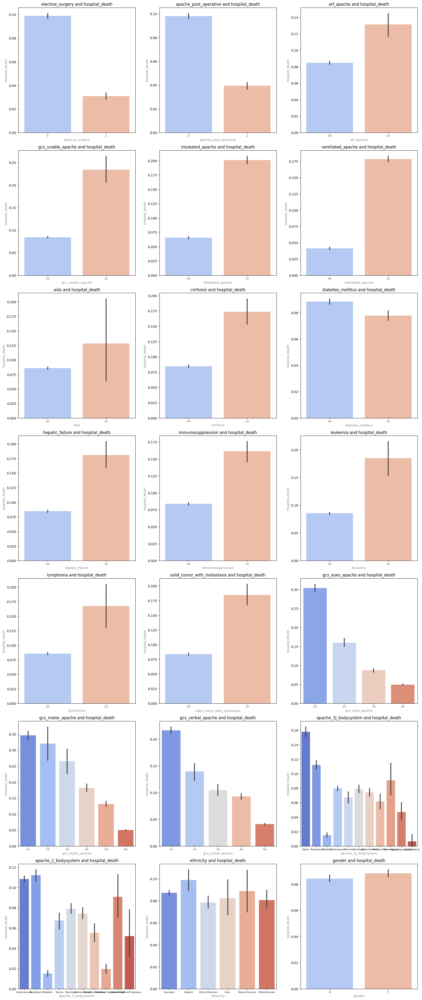

In [ ]:
# Grouping variables into binary, ordinal, and categorical
binary_ordinal_categorical = binary_variables + ordinal_variables + categorical_variables_1

#Setting Y/class

Class= 'hospital_death'

# Determining the number of subplots in each row
subplots_per_row = 3
total_rows = len(binary_ordinal_categorical) // subplots_per_row + 1

# Creating bar plots
fig, axes = plt.subplots(total_rows, subplots_per_row, figsize=(18, 6 * total_rows))

for i, variable_name in enumerate(binary_ordinal_categorical):
    row = i // subplots_per_row
    col = i % subplots_per_row
    sns.barplot(data=data, x=variable_name, y=Class, palette='coolwarm', ax=axes[row, col])
    axes[row, col].set_title(f"{variable_name} and {Class}")

# Adjusting the font size for unit names
    axes[row, col].set_xticklabels(axes[row, col].get_xticklabels(), fontsize=6.5)

# Adding and adjusting lables for both axes
for row in axes:
    for ax in row:
        ax.set_xlabel(ax.get_xlabel(), color='grey', fontsize=9.5)
        ax.set_ylabel(ax.get_ylabel(), color='grey', fontsize=9.5)

# Removing  empty subplots
for i in range(len(binary_ordinal_categorical), total_rows * subplots_per_row):
    fig.delaxes(axes[i // subplots_per_row, i % subplots_per_row])

plt.tight_layout()
plt.show()

It appears that differences in gender and ethnicity have limited significant association with the label class. Yet, these two variables will be included in the analysis to examine their effects.

In [ ]:
# Initialize the StandardScaler
scaler = StandardScaler()

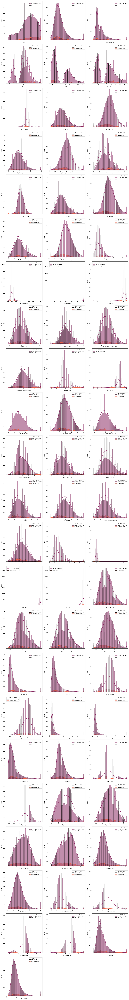

In [ ]:
# Determining the number of subplots in each row
subplots_per_row = 3
total_rows = len(numeric_variables) // subplots_per_row + 1

# Creating a grid of subplots
fig, axs = plt.subplots(total_rows, subplots_per_row, figsize=(18, 6 * total_rows))

# Creating a copy of the original data
data_copy = data.copy()

# Looping through each feature in numeric variables
for i, column in enumerate(numeric_variables):
    # Calculate the position for the subplot; x is the row index and y is the column index
    x = i // subplots_per_row
    y = i % subplots_per_row

    # Scaling the feature in the copied data using StandardScaler
    data_copy[column] = scaler.fit_transform(data_copy[[column]])

    # Plot a histogram of the scaled feature split by the 'hospital_death' class
    sns.histplot(data=data_copy, x=column, hue='Hospital Death', kde=True, palette='rocket', ax=axs[x][y])

# Removing any empty subplots
for i in range(len(numeric_variables), total_rows * subplots_per_row):
    fig.delaxes(axs[i // subplots_per_row, i % subplots_per_row])

# Display all the subplots
plt.tight_layout()
plt.show()

Histograms with Kernel Density Estimation (KDE) were used to examine the association between the class variable and the scaled numeric/integer variables. It appears that there are many variables where the distributions of the two classes vary significantly. Yet most importantly, it appears that also many variables have extreme outliers. This is understandable as many cases that will arrive at ICU will have extreme medical conditions. Variables with outliers beyong five standard deviations will be identified and transformed before carrying out logistic regression.

In [ ]:
#Removing visualization variable
data.drop(columns=['Hospital Death'], inplace=True)

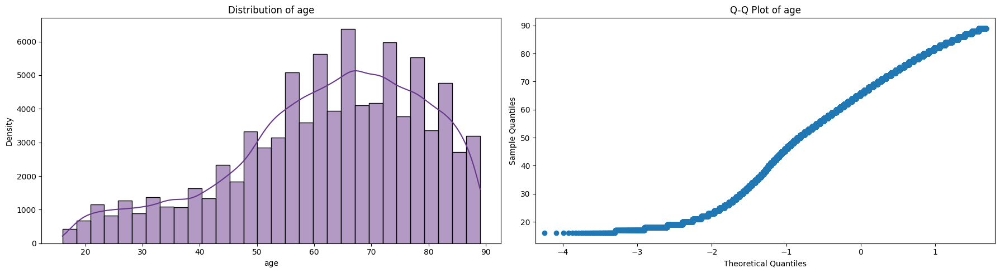

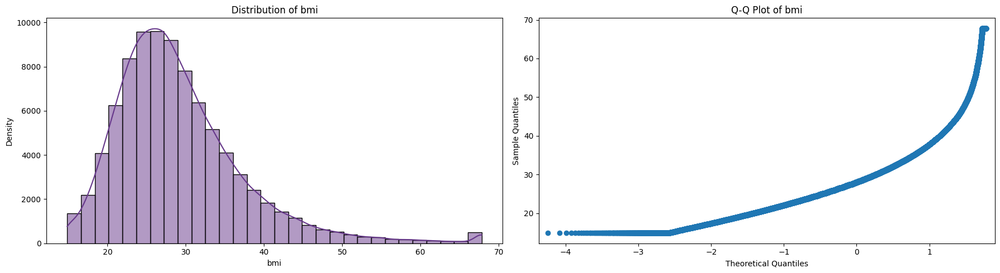

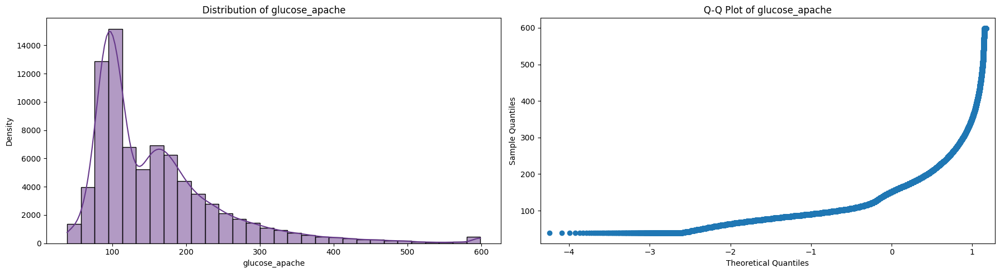

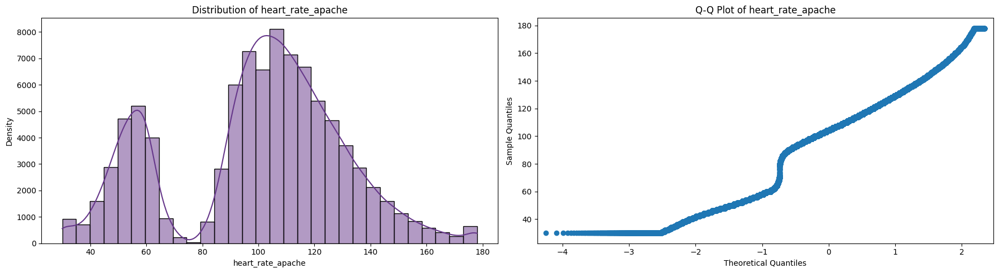

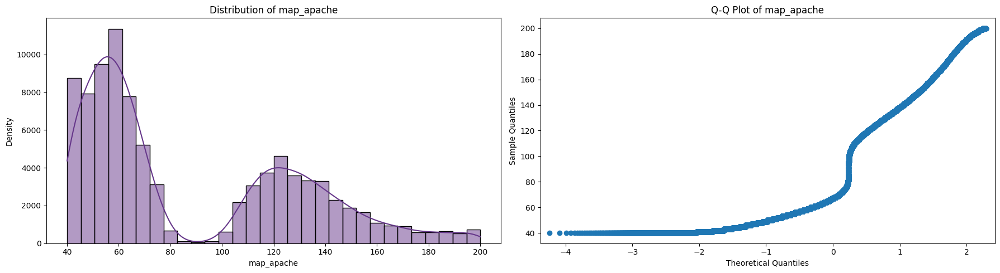

...

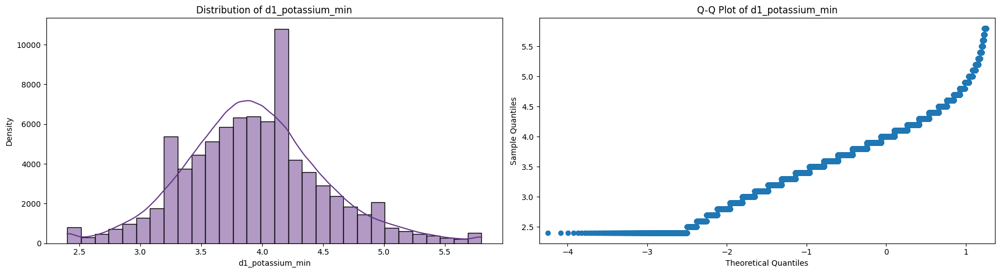

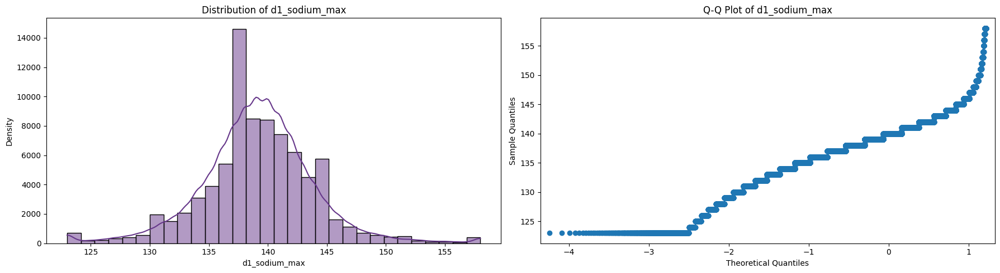

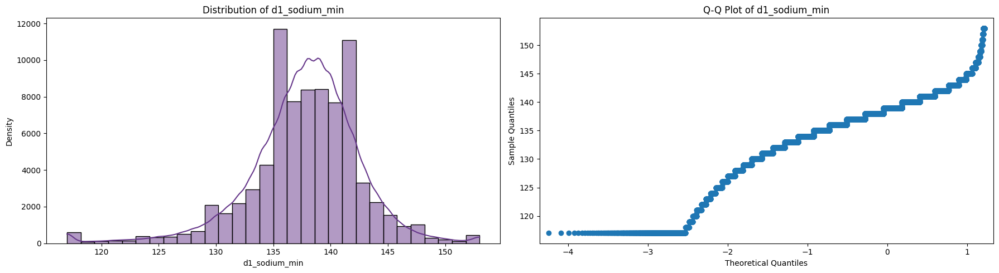

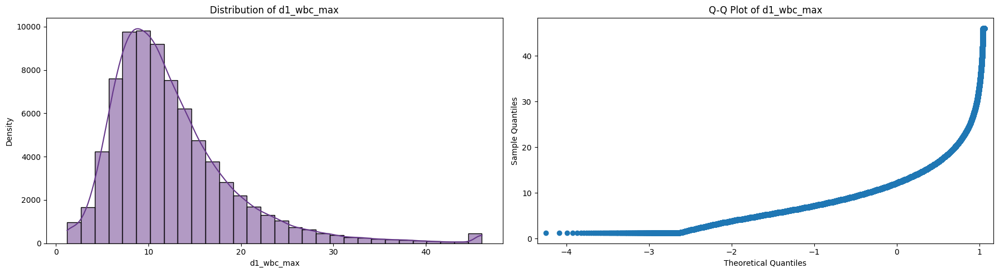

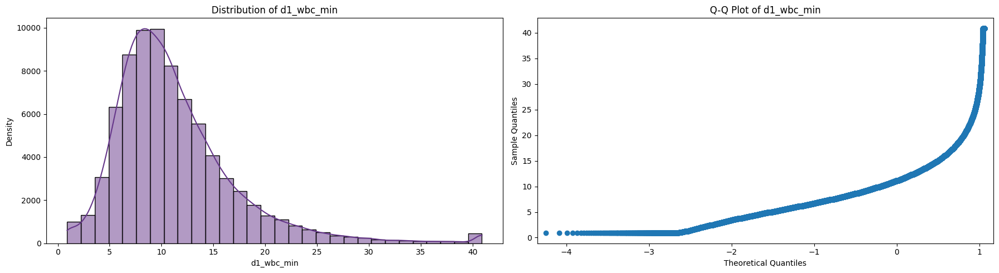

In [ ]:
#check for normality of data

for variable in numeric_variables:
    # Create a new figure for each variable
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(18, 5))

    # Histogram with a smoothed line (kernel density estimate)
    sns.histplot(data[variable], bins=30, kde=True, color='#66378a', ax=axes[0])
    axes[0].set_title(f'Distribution of {variable}')
    axes[0].set_xlabel(variable)
    axes[0].set_ylabel('Density')

    # Q-Q plot
    sm.qqplot(data[variable], line='s', color='#66378a', ax=axes[1])
    axes[1].set_title(f'Q-Q Plot of {variable}')

    # Adjust layout
    plt.tight_layout()
    plt.show()

**2.4.2 Identifying outliers**

In [327]:
# Defining a Z-score threshold
zscore_threshold = 5

# Initialize a list to store variable names with outliers
variables_with_outliers = []

# Iterate through each continuous variable and identify variables with outliers
for variable_name in numeric_variables:
    data_column = data[variable_name]
    z_scores = (data_column - data_column.mean()) / data_column.std()
    if any(abs(z_scores) > zscore_threshold):
        variables_with_outliers.append(variable_name)

# Printing the count of variables with outliers
print(f"Count of variables with outliers beyond 5 standard deviations: {len(variables_with_outliers)}")

# Printing the names of variables with outliers
print("Variables with outliers beyond 5 standard deviations:")
print(variables_with_outliers)

Count of variables with outliers beyond 5 standard deviations: 13
Variables with outliers beyond 5 standard deviations:
['temp_apache', 'd1_heartrate_min', 'd1_resprate_max', 'd1_resprate_min', 'd1_spo2_max', 'd1_spo2_min', 'd1_temp_min', 'h1_resprate_min', 'h1_spo2_max', 'h1_spo2_min', 'd1_creatinine_max', 'd1_creatinine_min', 'd1_glucose_max']


In [ ]:
Final_log = ['d1_resprate_max', 'd1_resprate_min', 'd1_spo2_max', 'd1_spo2_min', 'h1_spo2_max', 'h1_spo2_min', 'd1_creatinine_max', 'd1_creatinine_min', 'd1_glucose_max']

**2.5 Splitting data, Imputing  missing observations, and Specifying data categories**

In [328]:
X = data.drop('hospital_death', axis=1)
y = data['hospital_death']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Data imputation is carried out after splitting data to avoid data leakage from train to test data. Univariate/Simple imputation strategies will be applied as they are straightforward and require less configuration. Yet, they are less sensitive the distribution of the data compared to iterative imputing strategy.

In [329]:
# Creating an imputer for numeric variables with the strategy of 'median' #Konrad-changed this
numeric_imputer = SimpleImputer(strategy='median')

# Imputing numeric variables in the training set
X_train[numeric_variables] = numeric_imputer.fit_transform(X_train[numeric_variables])

# Imputing numeric variables in the test set
X_test[numeric_variables] = numeric_imputer.transform(X_test[numeric_variables])

In [330]:
# Creating an imputer for categorical, ordinal, and binary variables with the strategy of 'most_frequent/mode'
category_imputer = SimpleImputer(strategy='most_frequent')

# Imputing categorical, ordinal, and binary variables in the training set
X_train[categorical_variables_1 + ordinal_variables + binary_variables] = category_imputer.fit_transform(X_train[categorical_variables_1 + ordinal_variables + binary_variables])

# Imputing categorical, ordinal, and binary variables in the test set
X_test[categorical_variables_1 + ordinal_variables + binary_variables] = category_imputer.transform(X_test[categorical_variables_1 + ordinal_variables + binary_variables])


In [331]:
print("Numeric Variables:")
print(numeric_variables)
print("Count of Numeric Variables:", len(numeric_variables))

Numeric Variables:
['age', 'bmi', 'glucose_apache', 'heart_rate_apache', 'map_apache', 'resprate_apache', 'temp_apache', 'd1_diasbp_max', 'd1_diasbp_min', 'd1_diasbp_noninvasive_max', 'd1_diasbp_noninvasive_min', 'd1_heartrate_max', 'd1_heartrate_min', 'd1_mbp_max', 'd1_mbp_min', 'd1_mbp_noninvasive_max', 'd1_mbp_noninvasive_min', 'd1_resprate_max', 'd1_resprate_min', 'd1_spo2_max', 'd1_spo2_min', 'd1_sysbp_max', 'd1_sysbp_min', 'd1_sysbp_noninvasive_max', 'd1_sysbp_noninvasive_min', 'd1_temp_max', 'd1_temp_min', 'h1_diasbp_max', 'h1_diasbp_min', 'h1_diasbp_noninvasive_max', 'h1_diasbp_noninvasive_min', 'h1_heartrate_max', 'h1_heartrate_min', 'h1_mbp_max', 'h1_mbp_min', 'h1_mbp_noninvasive_max', 'h1_mbp_noninvasive_min', 'h1_resprate_max', 'h1_resprate_min', 'h1_spo2_max', 'h1_spo2_min', 'h1_sysbp_max', 'h1_sysbp_min', 'h1_sysbp_noninvasive_max', 'h1_sysbp_noninvasive_min', 'd1_bun_max', 'd1_bun_min', 'd1_calcium_max', 'd1_calcium_min', 'd1_creatinine_max', 'd1_creatinine_min', 'd1_glu

In [332]:
# Specifying data types for the training set
X_train[numeric_variables] = X_train[numeric_variables].astype(float)
X_train[categorical_variables_1] = X_train[categorical_variables_1].astype('category')
X_train[categorical_variables_2] = X_train[categorical_variables_2].astype('category')
X_train[binary_variables] = X_train[binary_variables].astype(int)
X_train[ordinal_variables] = X_train[ordinal_variables].astype(int)
y_train = y_train.astype(int)

# Specifying data types for the test set
X_test[numeric_variables] = X_test[numeric_variables].astype(float)
X_test[categorical_variables_1] = X_test[categorical_variables_1].astype('category')
X_test[categorical_variables_2] = X_test[categorical_variables_2].astype('category')
X_test[binary_variables] = X_test[binary_variables].astype(int)
X_test[ordinal_variables] = X_test[ordinal_variables].astype(int)
y_test = y_test.astype(int)

**Back to tackling imbalanced data.**

Highly imbalanced dataset (i.e., one class is predominant), might lead to the situation where a predictive model might not be able to make meaningful distinctions between the classes. As the majority class (patients who did not pass away) are significantly larger than the minority class, undersampling will be used to balance the classes. In fact, this method will be computationally efficient as it will reduce the observations in our large dataset. Yet, we might still risk losing information due to omitting observations for the majority classes.

In [333]:
# Application of RUS for undersampling  the training data
rus = RandomUnderSampler()
X_resampled, y_resampled = rus.fit_resample(X_train, y_train)

# Specifying categorical and ordinal columns to one-hot encode
categorical_ordinal_columns = categorical_variables_1 + ordinal_variables

#Initializing a column transformer for one-hot encoding and target encoding
ct = ColumnTransformer(
    transformers=[
        ('one_hot_encoder', OneHotEncoder(), categorical_ordinal_columns),
        ('target_encoder', TargetEncoder(), categorical_variables_2)
    ],remainder='passthrough'
)

# Applying the one-hot encoding transformation to X_resampled and X_test
X_resampled = ct.fit_transform(X_resampled, y_resampled)
X_test = ct.transform(X_test)

In [334]:
#converting numpyarray back to DataFrame
X_resampled = pd.DataFrame(X_resampled, columns=ct.get_feature_names_out())
X_test = pd.DataFrame(X_test, columns=ct.get_feature_names_out())

In [335]:
correlation_matrix = data[numeric_variables].corr()

high_correlation_pairs = []
for i in range(len(correlation_matrix.columns)):
    for j in range(i + 1, len(correlation_matrix.columns)):
        if abs(correlation_matrix.iloc[i, j]) > 0.9:
            pair = (correlation_matrix.columns[i], correlation_matrix.columns[j])
            high_correlation_pairs.append(pair)

print("Pairs of variables with correlation > 0.9:")
for pair in high_correlation_pairs:
    print(pair)

Pairs of variables with correlation > 0.9:
('glucose_apache', 'd1_glucose_max')
('d1_diasbp_max', 'd1_diasbp_noninvasive_max')
('d1_diasbp_min', 'd1_diasbp_noninvasive_min')
('d1_mbp_max', 'd1_mbp_noninvasive_max')
('d1_mbp_min', 'd1_mbp_noninvasive_min')
('d1_sysbp_max', 'd1_sysbp_noninvasive_max')
('d1_sysbp_min', 'd1_sysbp_noninvasive_min')
('h1_diasbp_max', 'h1_diasbp_noninvasive_max')
('h1_diasbp_min', 'h1_diasbp_noninvasive_min')
('h1_mbp_max', 'h1_mbp_noninvasive_max')
('h1_mbp_min', 'h1_mbp_noninvasive_min')
('h1_sysbp_max', 'h1_sysbp_noninvasive_max')
('h1_sysbp_min', 'h1_sysbp_noninvasive_min')
('d1_bun_max', 'd1_bun_min')
('d1_creatinine_max', 'd1_creatinine_min')
('d1_hemaglobin_max', 'd1_hematocrit_max')
('d1_hemaglobin_min', 'd1_hematocrit_min')
('d1_hematocrit_max', 'd1_hematocrit_min')
('d1_platelets_max', 'd1_platelets_min')
('d1_wbc_max', 'd1_wbc_min')


**2.6 Tackling multicollinearity**

Dropping variables to mitigate high collinearity. Variables selected for deletion are the ones with the highes missing values, as determined in section 2.1. In instances where the pairs have the smae level of missing values, we used literature and clinical thresholds to determine which one to keep.

In [337]:
variables_to_drop_col = ['glucose_apache', 'd1_diasbp_noninvasive_max','d1_diasbp_noninvasive_min', 'd1_mbp_noninvasive_max', 'd1_mbp_noninvasive_min', 'h1_diasbp_noninvasive_max', 'h1_diasbp_noninvasive_min', 'h1_mbp_noninvasive_max', 'h1_mbp_noninvasive_min', 'h1_sysbp_noninvasive_max', 'h1_sysbp_noninvasive_min', 'd1_hemaglobin_max', 'd1_bun_min', 'd1_creatinine_max', 'd1_hemaglobin_max', 'd1_hemaglobin_min', 'd1_hematocrit_min', 'd1_platelets_min', 'd1_wbc_min']

In [ ]:
X_resampled.drop(variables_to_drop_col, axis=1, inplace=True)
X_test.drop(variables_to_drop_col, axis=1, inplace=True)

Scaling numeric variables is carried out after rus in order to ensure obtaining accurate distribution of standardized data. Later while running decision trees and random forests, we might not need scaled data. Thus, we are differentiating between both forms here.

In [ ]:
(X_resampled.shape)

(12656, 128)

In [ ]:
{X_test.shape}

{(18343, 128)}

In [ ]:
{y_test.shape}

{(18343,)}

In [ ]:
(y_resampled.shape)

(12656,)

**Section 3: Building a logistc regression model**

**3.1 Applying Recursive Feature Elimination with Cross-Validation for Logistic regession**

As  we have 128 shortlisted variables, testing all combinations might be infeasible. Thus, the recursive feature elimination with cross validation (RFECV) will be applied to find the optimal subset of variables that maximizes the performance of the model while also avoiding overfitting. The evaluation metric here will be the recall score. Removing less important variables will make the model more interpretable, and more generalizable to unseen data. The tool initiates optimization with all variables included; thereafter, it eliminates one variables at a time. The tool relies on the average performance score of the model on the test data through each iteration.

In [ ]:
#Normalizing data
X_resampled_scaled = scaler.fit_transform(X_resampled)
X_test_scaled = scaler.transform(X_test)

In [ ]:
#setting custom scorer
recall_scoring = make_scorer(recall_score)

In [ ]:
Log_reg_model = LogisticRegression()

cv_LR = StratifiedKFold(5)
rfecv_LR = RFECV(
    estimator=Log_reg_model,
    step=1,
    cv=cv_LR,
    scoring=recall_scoring,
    min_features_to_select=1,
)
rfecv_LR.fit(X_resampled_scaled, y_resampled)

# Print the optimal number of selected features
print(f"Optimal number of features -LR: {rfecv_LR.n_features_}")

Optimal number of features -LR: 60


In [ ]:
# which columns used and which wasn't
rfecv_LR.support_

array([False, False, False, False, False, False,  True, False, False,
        True, False, False, False, False,  True,  True,  True, False,
       False,  True,  True, False, False, False, False, False, False,
       False, False,  True, False, False, False,  True, False, False,
       False, False,  True, False, False, False, False,  True,  True,
        True,  True, False,  True, False, False,  True,  True, False,
       False, False, False,  True, False,  True,  True,  True,  True,
        True,  True, False,  True, False,  True,  True, False, False,
        True,  True,  True, False,  True,  True, False,  True,  True,
       False,  True, False,  True, False,  True,  True,  True,  True,
       False,  True, False, False,  True,  True,  True,  True, False,
        True, False, False, False, False, False, False,  True,  True,
        True,  True,  True,  True,  True,  True, False, False,  True,
        True,  True,  True, False,  True, False, False, False, False,
       False,  True]

In [ ]:
rfecv_LR.ranking_

array([13, 53,  5,  6, 50, 26,  1, 12, 58,  1, 46, 52, 63, 38,  1,  1,  1,
       45, 57,  1,  1, 55, 68, 62, 49, 44, 67, 54, 47,  1, 59, 34, 19,  1,
        4, 42, 56, 51,  1, 61, 18, 65, 20,  1,  1,  1,  1, 14,  1, 69, 60,
        1,  1, 16, 35,  8, 11,  1,  7,  1,  1,  1,  1,  1,  1, 31,  1, 43,
        1,  1, 23, 21,  1,  1,  1,  2,  1,  1, 30,  1,  1,  3,  1, 66,  1,
       36,  1,  1,  1,  1, 64,  1, 29, 22,  1,  1,  1,  1, 10,  1, 24, 25,
       41, 40, 15, 17,  1,  1,  1,  1,  1,  1,  1,  1, 28, 37,  1,  1,  1,
        1, 39,  1, 32, 33,  9, 48, 27,  1])

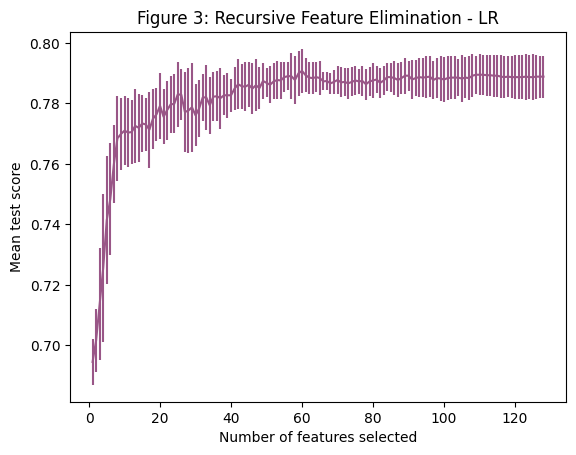

In [ ]:
# Calculate the number of different feature selections tested
n_scores_LR = len(rfecv_LR.cv_results_["mean_test_score"])

# Create a new figure for plotting
plt.figure()

# Set labels for the x and y axes
plt.xlabel("Number of features selected")
plt.ylabel("Mean test score")

# Plot the mean test scores with error bars
plt.errorbar(
    range(1, n_scores_LR + 1),
    rfecv_LR.cv_results_["mean_test_score"],
    yerr=rfecv_LR.cv_results_["std_test_score"],
    color='#995687'  # Change the color to green
)

# Set the title for the plot
plt.title("Figure 3: Recursive Feature Elimination - LR")

# Show the plot
plt.show()

In [ ]:
selected_LR_features = X_resampled.columns[rfecv_LR.support_]
eliminated_LR_features = X_resampled.columns[~rfecv_LR.support_]

print("Selected Features for LR:")
print(selected_LR_features)
print("\nEliminated Features for LR:")
print(eliminated_LR_features)

Selected Features for LR:
Index(['one_hot_encoder__apache_3j_bodysystem_Musculoskeletal/Skin',
       'one_hot_encoder__apache_3j_bodysystem_Sepsis',
       'one_hot_encoder__apache_2_bodysystem_Metabolic',
       'one_hot_encoder__apache_2_bodysystem_Neurologic',
       'one_hot_encoder__apache_2_bodysystem_Renal/Genitourinary',
       'one_hot_encoder__apache_2_bodysystem_Undefined Diagnoses',
       'one_hot_encoder__apache_2_bodysystem_Undefined diagnoses',
       'one_hot_encoder__gcs_eyes_apache_1',
       'one_hot_encoder__gcs_motor_apache_1',
       'one_hot_encoder__gcs_motor_apache_6',
       'one_hot_encoder__gcs_verbal_apache_5',
       'target_encoder__apache_2_diagnosis',
       'target_encoder__apache_3j_diagnosis', 'remainder__age',
       'remainder__elective_surgery', 'remainder__arf_apache',
       'remainder__gcs_unable_apache', 'remainder__resprate_apache',
       'remainder__ventilated_apache', 'remainder__d1_diasbp_max',
       'remainder__d1_diasbp_min', 'remain

In [ ]:
# Accessing the mean test scores
mean_test_scores_LR = rfecv_LR.cv_results_["mean_test_score"]

# Printing the list of mean test scores along with the number of selected features
for i, score_LR in enumerate(mean_test_scores_LR):
    num_selected_features = i + 1  #start with one feature
    print(f"Number of Selected Features: {num_selected_features}, Mean Test Score: {score_LR}")

Number of Selected Features: 1, Mean Test Score: 0.6945330910589513
Number of Selected Features: 2, Mean Test Score: 0.7016458423093493
Number of Selected Features: 3, Mean Test Score: 0.7136571567727554
Number of Selected Features: 4, Mean Test Score: 0.7256668477480346
Number of Selected Features: 5, Mean Test Score: 0.7414678830339247
Number of Selected Features: 6, Mean Test Score: 0.7484227812849285
Number of Selected Features: 7, Mean Test Score: 0.7599581639598124
Number of Selected Features: 8, Mean Test Score: 0.7684888447633141
Number of Selected Features: 9, Mean Test Score: 0.769911894548202
Number of Selected Features: 10, Mean Test Score: 0.7710182392646847
Number of Selected Features: 11, Mean Test Score: 0.770385828197491
Number of Selected Features: 12, Mean Test Score: 0.7705434314294812
Number of Selected Features: 13, Mean Test Score: 0.7725975185608402
Number of Selected Features: 14, Mean Test Score: 0.7719654821447527
Number of Selected Features: 15, Mean Test Sc

While the application of rfecv suggests that the optimal number of variables to inlcude in a logistic regression model is 69, the mean test score does not signifcantly increase after 25 features. Thus, lasso regression will be applied to determine important variables with non-zero coefficients. This approach is widely used in relevant research that designed prediction models for in-hospital mortality:
Zhou, Jingmin et al. (2021). Prediction model of in-hospital mortality in intensive care unit patients with heart failure: machine learning-based, retrospective analysis of the MIMIC-III database. Dryad.

**3.2 Applying Lasso Penalty to determine the important features**

In [ ]:
#creating a list for features
selected_columns_lasso = ['one_hot_encoder__apache_3j_bodysystem_Musculoskeletal/Skin',
       'one_hot_encoder__apache_3j_bodysystem_Sepsis',
       'one_hot_encoder__apache_2_bodysystem_Metabolic',
       'one_hot_encoder__apache_2_bodysystem_Neurologic',
       'one_hot_encoder__apache_2_bodysystem_Renal/Genitourinary',
       'one_hot_encoder__apache_2_bodysystem_Undefined Diagnoses',
       'one_hot_encoder__apache_2_bodysystem_Undefined diagnoses',
       'one_hot_encoder__gcs_eyes_apache_1',
       'one_hot_encoder__gcs_motor_apache_1',
       'one_hot_encoder__gcs_motor_apache_6',
       'one_hot_encoder__gcs_verbal_apache_5',
       'target_encoder__apache_2_diagnosis',
       'target_encoder__apache_3j_diagnosis', 'remainder__age',
       'remainder__elective_surgery', 'remainder__arf_apache',
       'remainder__gcs_unable_apache', 'remainder__resprate_apache',
       'remainder__ventilated_apache', 'remainder__d1_diasbp_max',
       'remainder__d1_diasbp_min', 'remainder__d1_diasbp_noninvasive_max',
       'remainder__d1_diasbp_noninvasive_min', 'remainder__d1_heartrate_max',
       'remainder__d1_mbp_max', 'remainder__d1_mbp_noninvasive_max',
       'remainder__d1_mbp_noninvasive_min', 'remainder__d1_spo2_max',
       'remainder__d1_spo2_min', 'remainder__d1_sysbp_max',
       'remainder__d1_sysbp_noninvasive_max',
       'remainder__d1_sysbp_noninvasive_min', 'remainder__d1_temp_min',
       'remainder__h1_diasbp_max', 'remainder__h1_diasbp_noninvasive_max',
       'remainder__h1_heartrate_max', 'remainder__h1_mbp_max',
       'remainder__h1_mbp_min', 'remainder__h1_mbp_noninvasive_max',
       'remainder__h1_mbp_noninvasive_min', 'remainder__h1_resprate_min',
       'remainder__h1_sysbp_max', 'remainder__h1_sysbp_min',
       'remainder__h1_sysbp_noninvasive_max',
       'remainder__h1_sysbp_noninvasive_min', 'remainder__d1_bun_min',
       'remainder__d1_hco3_max', 'remainder__d1_hco3_min',
       'remainder__d1_hemaglobin_max', 'remainder__d1_hemaglobin_min',
       'remainder__d1_hematocrit_max', 'remainder__d1_hematocrit_min',
       'remainder__d1_platelets_max', 'remainder__d1_platelets_min',
       'remainder__d1_sodium_max', 'remainder__d1_sodium_min',
       'remainder__d1_wbc_max', 'remainder__d1_wbc_min',
       'remainder__cirrhosis', 'remainder__solid_tumor_with_metastasis']

In [ ]:
X_lasso = X_resampled[selected_columns_lasso]

In [ ]:
from sklearn.preprocessing import StandardScaler

# Scale the features in X_lasso
scaler_lasso = StandardScaler()
X_lasso_scaled = scaler_lasso.fit_transform(X_lasso)

# Create and fit the logistic regression model with Lasso regularization
logistic_regression_lasso = LogisticRegression(penalty='l1', C= 0.0049, solver='liblinear')
logistic_regression_lasso.fit(X_lasso_scaled, y_resampled)


LogisticRegression(C=0.0049, penalty='l1', solver='liblinear')

In [ ]:
# Printing the coefficients and selected feature names
coefs = logistic_regression_lasso.coef_[0]
selected_features_LR = [feature for feature, coef in zip(selected_columns_lasso, coefs) if abs(coef) != 0]
print(f"Count of variables: {len(selected_features_LR)}")
print("Variable names and their coefficients:")
for feature, coef in zip(selected_features_LR, coefs):
    print(f"{feature}: {coef}")


Count of variables: 25
Variable names and their coefficients:
one_hot_encoder__apache_2_bodysystem_Neurologic: 0.0
one_hot_encoder__apache_2_bodysystem_Undefined diagnoses: 0.0
one_hot_encoder__gcs_eyes_apache_1: 0.0
one_hot_encoder__gcs_motor_apache_1: 0.0013063806646693816
one_hot_encoder__gcs_motor_apache_6: 0.0
one_hot_encoder__gcs_verbal_apache_5: 0.0
target_encoder__apache_3j_diagnosis: -0.0075612839514926575
remainder__age: 0.129820672513556
remainder__elective_surgery: 0.055122568333865946
remainder__gcs_unable_apache: -0.09862331490887757
remainder__resprate_apache: -0.11491283072350124
remainder__ventilated_apache: 0.0
remainder__d1_diasbp_min: 0.6059170450673531
remainder__d1_heartrate_max: 0.29301141578750595
remainder__d1_mbp_noninvasive_min: -0.10283407654309333
remainder__d1_spo2_min: 0.0
remainder__d1_sysbp_noninvasive_min: 0.0003822053914623067
remainder__d1_temp_min: 0.0483988026153071
remainder__h1_resprate_min: 0.33384368240271944
remainder__d1_bun_min: 0.0
remainde

In [ ]:
selected_features_LR

['one_hot_encoder__apache_2_bodysystem_Neurologic',
 'one_hot_encoder__apache_2_bodysystem_Undefined diagnoses',
 'one_hot_encoder__gcs_eyes_apache_1',
 'one_hot_encoder__gcs_motor_apache_1',
 'one_hot_encoder__gcs_motor_apache_6',
 'one_hot_encoder__gcs_verbal_apache_5',
 'target_encoder__apache_3j_diagnosis',
 'remainder__age',
 'remainder__elective_surgery',
 'remainder__gcs_unable_apache',
 'remainder__resprate_apache',
 'remainder__ventilated_apache',
 'remainder__d1_diasbp_min',
 'remainder__d1_heartrate_max',
 'remainder__d1_mbp_noninvasive_min',
 'remainder__d1_spo2_min',
 'remainder__d1_sysbp_noninvasive_min',
 'remainder__d1_temp_min',
 'remainder__h1_resprate_min',
 'remainder__d1_bun_min',
 'remainder__d1_hco3_min',
 'remainder__d1_hemaglobin_min',
 'remainder__d1_wbc_max',
 'remainder__cirrhosis',
 'remainder__solid_tumor_with_metastasis']

**3.3 Developing a logistic regression prediction model**

In [ ]:
LR_features = ['one_hot_encoder__apache_2_bodysystem_Neurologic',
 'one_hot_encoder__apache_2_bodysystem_Undefined diagnoses',
 'one_hot_encoder__gcs_eyes_apache_1',
 'one_hot_encoder__gcs_motor_apache_1',
 'one_hot_encoder__gcs_motor_apache_6',
 'one_hot_encoder__gcs_verbal_apache_5',
 'target_encoder__apache_3j_diagnosis',
 'remainder__age',
 'remainder__elective_surgery',
 'remainder__gcs_unable_apache',
 'remainder__resprate_apache',
 'remainder__ventilated_apache',
 'remainder__d1_diasbp_min',
 'remainder__d1_heartrate_max',
 'remainder__d1_mbp_noninvasive_min',
 'remainder__d1_spo2_min',
 'remainder__d1_sysbp_noninvasive_min',
 'remainder__d1_temp_min',
 'remainder__h1_resprate_min',
 'remainder__d1_bun_min',
 'remainder__d1_hco3_min',
 'remainder__d1_hemaglobin_min',
 'remainder__d1_wbc_max',
 'remainder__cirrhosis',
 'remainder__solid_tumor_with_metastasis']

In [ ]:
#Fitting the data
X_train_scaled_LR = scaler.fit_transform(X_resampled[LR_features])
X_test_scaled_LR = scaler.transform(X_test[LR_features])

In [ ]:
LR_model = LogisticRegression(penalty='l2', C=1.0, solver='liblinear')
LR_model.fit(X_train_scaled_LR, y_resampled)

LogisticRegression(solver='liblinear')

In [ ]:
# Using cross_val_predict to get predicted labels for each fold of cross-validation
predicted_labels_LR_model = cross_val_predict(LR_model, X_train_scaled_LR, y_resampled, cv=5)

# Calculating the full confusion matrix
conf_matrix_LR = confusion_matrix(y_resampled, predicted_labels_LR_model)

# Calculate the full classification report
class_report_LR = classification_report(y_resampled, predicted_labels_LR_model)

# Calculate accuracy
accuracy_LR = accuracy_score(y_resampled, predicted_labels_LR_model)

# Calculate precision
precision_LR = precision_score(y_resampled, predicted_labels_LR_model)

# Calculate recall
recall_LR = recall_score(y_resampled, predicted_labels_LR_model)

# Calculate F1 score
f1_LR = f1_score(y_resampled, predicted_labels_LR_model)


# Print the full confusion matrix and classification report
print("Table 1A: Filtered Logistic Model Confusion Matrix/Classification Report")
print("A. Confusion Matrix:")
print(conf_matrix_LR)
print("B. Classification Report:")
print(class_report_LR)
print("C. Accuracy: {:.2f}".format(accuracy_LR))
print("D. Precision: {:.2f}".format(precision_LR))
print("E. Recall (Sensitivity): {:.2f}".format(recall_LR))
print("F. F1 Score: {:.2f}".format(f1_LR))

Table 1A: Filtered Logistic Model Confusion Matrix/Classification Report
A. Confusion Matrix:
[[5047 1281]
 [1341 4987]]
B. Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.80      0.79      6328
           1       0.80      0.79      0.79      6328

    accuracy                           0.79     12656
   macro avg       0.79      0.79      0.79     12656
weighted avg       0.79      0.79      0.79     12656

C. Accuracy: 0.79
D. Precision: 0.80
E. Recall (Sensitivity): 0.79
F. F1 Score: 0.79


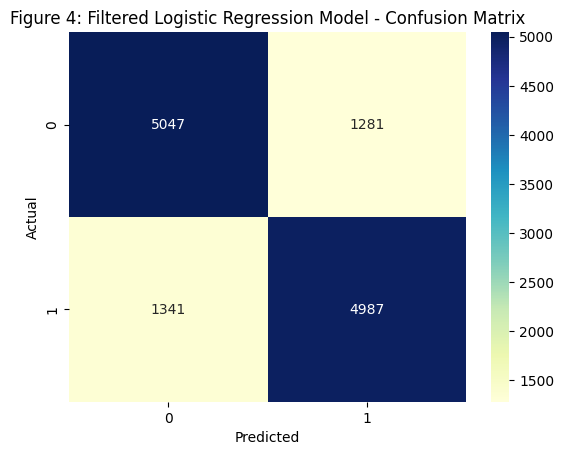

In [ ]:
sns.heatmap(conf_matrix_LR, annot=True, fmt='d', cmap='YlGnBu')
plt.title('Figure 4: Filtered Logistic Regression Model - Confusion Matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

Test ROC-AUC: 0.8760


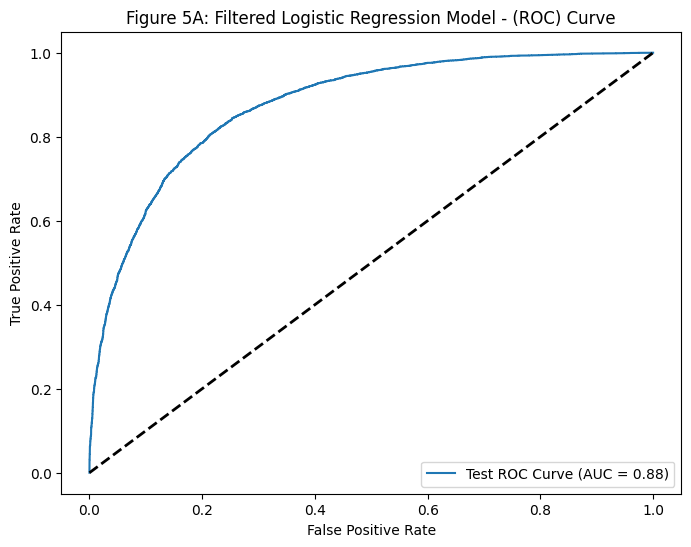

In [ ]:

predicted_probs_LR = LR_model.predict_proba(X_train_scaled_LR)[:, 1]  # probability of 1 (outcome)

# Calculate ROC-AUC on the train set
roc_auc_train_LR = roc_auc_score(y_resampled, predicted_probs_LR)
print(f"Test ROC-AUC: {roc_auc_train_LR:.4f}")

# Calculate ROC curve on the train set
fpr_test_LR, tpr_test_LR, _ = roc_curve(y_resampled, predicted_probs_LR)

# Plot ROC curve for the train set
plt.figure(figsize=(8, 6))
plt.plot(fpr_test_LR, tpr_test_LR, label=f'Test ROC Curve (AUC = {roc_auc_train_LR:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Figure 5A: Filtered Logistic Regression Model - (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


In [ ]:
# Making predictions on the test set of Logit Regression
y_pred_test_LR = LR_model.predict(X_test_scaled_LR)

# Calculating metrics
accuracy_test_LR = accuracy_score(y_test, y_pred_test_LR)
precision_test_LR = precision_score(y_test, y_pred_test_LR)
recall_test_LR = recall_score(y_test, y_pred_test_LR)
f1_test_LR = f1_score(y_test, y_pred_test_LR)
conf_matrix_test_LR = confusion_matrix(y_test, y_pred_test_LR)

# Printing the evaluation metrics
print("Table 1B: Filtered Logistic Model - Test Set- Confusion Matrix/Classification Report")
print("Accuracy: {:.2f}".format(accuracy_test_LR))
print("Precision: {:.2f}".format(precision_test_LR))
print("Recall (Sensitivity): {:.2f}".format(recall_test_LR))
print("F1 Score: {:.2f}".format(f1_test_LR))
print("Confusion Matrix:")
print(conf_matrix_test_LR)

Table 1B: Filtered Logistic Model - Test Set- Confusion Matrix/Classification Report
Accuracy: 0.79
Precision: 0.27
Recall (Sensitivity): 0.78
F1 Score: 0.40
Confusion Matrix:
[[13319  3437]
 [  346  1241]]


Test ROC-AUC: 0.8719


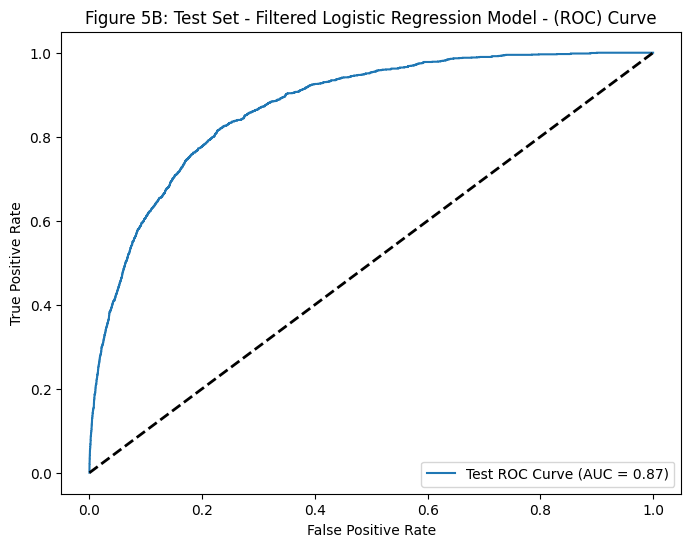

In [ ]:
# Making predictions on the test set of Logistic Regression
predicted_probs_test_LR = LR_model.predict_proba(X_test_scaled_LR)[:, 1]

# Calculate ROC-AUC on the test set
roc_auc_test_LR = roc_auc_score(y_test, predicted_probs_test_LR)
print(f"Test ROC-AUC: {roc_auc_test_LR:.4f}")

# Calculate ROC curve on the test set
fpr_test_LR, tpr_test_LR, _ = roc_curve(y_test, predicted_probs_test_LR)

# Plot ROC curve for the test set
plt.figure(figsize=(8, 6))
plt.plot(fpr_test_LR, tpr_test_LR, label=f'Test ROC Curve (AUC = {roc_auc_test_LR:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Figure 5B: Test Set - Filtered Logistic Regression Model - (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

It seems that logistic regression is performing relatively well. Accuracy and recall scores on unseen (test) data is 0.79 and 0.78 respectively. AUC of the application of the model on the unseen is 0.87 which is almost equal to the AUC of the model when tested on the training set. Yet, when the model was fit to the unseen data, F1 score and precision dropped significantly. Due the complex relationship between the dependent variables, decisionTrees might provide better perdictive abilities

**Section 4: Application of Decision Tree**

**4.1 Application of RFECV and RFE to obtain important features for Decision Trees**

RFECV was applied before in this excercise using the estimator of logitic regression. However, the scaled version of X_resampled was used as this is required for logistic regression. On the other hand, Decision Tress are not sensitive to he scale of variables as it makes splits based on individual variables. Thus, there is a need to repeat RFECV using Decision Trees as the estimator, and fitting the unscaled training data to it.

In [ ]:
DT_model = DecisionTreeClassifier()

cv_DT = StratifiedKFold(5)
rfecv_DT = RFECV(
    estimator=DT_model,
    step=1,
    cv=cv_DT,
    scoring=recall_scoring,
    min_features_to_select=1,
)

rfecv_DT.fit(X_resampled, y_resampled)

# Print the optimal number of selected features
print(f"Optimal number of features -DT: {rfecv_DT.n_features_}")

Optimal number of features -DT: 54


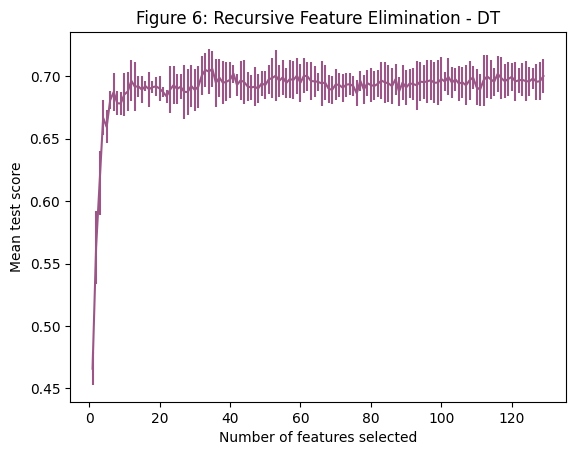

In [ ]:
# Calculate the number of different feature selections tested
n_scores_DT = len(rfecv_DT.cv_results_["mean_test_score"])

# Create a new figure for plotting
plt.figure()

# Set labels for the x and y axes
plt.xlabel("Number of features selected")
plt.ylabel("Mean test score")

# Plot the mean test scores with error bars
plt.errorbar(
    range(1, n_scores_DT + 1),
    rfecv_DT.cv_results_["mean_test_score"],
    yerr=rfecv_DT.cv_results_["std_test_score"],
    color='#995687'  # Change the color to green
)

# Set the title for the plot
plt.title("Figure 6: Recursive Feature Elimination - DT")

# Show the plot
plt.show()

In [ ]:
selected_DT_features = X_resampled.columns[rfecv_DT.support_]

print("Selected Features for DT:")
print(selected_DT_features)

Selected Features for DT:
Index(['one_hot_encoder__gcs_motor_apache_1', 'remainder__age',
       'remainder__bmi', 'remainder__apache_2_diagnosis',
       'remainder__apache_3j_diagnosis', 'remainder__resprate_apache',
       'remainder__temp_apache', 'remainder__ventilated_apache',
       'remainder__d1_diasbp_min', 'remainder__d1_heartrate_max',
       'remainder__d1_heartrate_min', 'remainder__d1_mbp_min',
       'remainder__d1_mbp_noninvasive_max', 'remainder__d1_resprate_max',
       'remainder__d1_resprate_min', 'remainder__d1_spo2_min',
       'remainder__d1_sysbp_min', 'remainder__d1_temp_max',
       'remainder__d1_temp_min', 'remainder__h1_resprate_max',
       'remainder__h1_resprate_min', 'remainder__h1_sysbp_max',
       'remainder__h1_sysbp_noninvasive_min', 'remainder__d1_bun_max',
       'remainder__d1_calcium_min', 'remainder__d1_creatinine_max',
       'remainder__d1_glucose_max', 'remainder__d1_glucose_min',
       'remainder__d1_hco3_min', 'remainder__d1_hemaglobin_

In [ ]:
# Accessing the mean test scores
mean_test_scores_DT = rfecv_DT.cv_results_["mean_test_score"]

# Printing the list of mean test scores along with the number of selected features
for t, score_DT in enumerate(mean_test_scores_DT):
    DT_selected_features = t + 1  #start with one feature
    print(f"Number of Selected Features: {DT_selected_features}, Mean Test Score: {score_DT}")

Number of Selected Features: 1, Mean Test Score: 0.4657119307644756
Number of Selected Features: 2, Mean Test Score: 0.563061399072114
Number of Selected Features: 3, Mean Test Score: 0.6145689326814404
Number of Selected Features: 4, Mean Test Score: 0.6667184934030185
Number of Selected Features: 5, Mean Test Score: 0.6594532591524144
Number of Selected Features: 6, Mean Test Score: 0.6809437461364105
Number of Selected Features: 7, Mean Test Score: 0.6874204646922555
Number of Selected Features: 8, Mean Test Score: 0.678414726286146
Number of Selected Features: 9, Mean Test Score: 0.678252627240882
Number of Selected Features: 10, Mean Test Score: 0.6853603831431979
Number of Selected Features: 11, Mean Test Score: 0.6878914011326951
Number of Selected Features: 12, Mean Test Score: 0.6964234556569194
Number of Selected Features: 13, Mean Test Score: 0.6916866168380695
Number of Selected Features: 14, Mean Test Score: 0.69200182330205
Number of Selected Features: 15, Mean Test Score

While the application of rfecv here suggests that the optimal number of variables to inlcude in a Decision Trees model is 111, the mean test score does not signifcantly increase after 13 features. In this case, RFE will be used where selection of features will be set to 13. This approach would remove the least important features, based on gini impurity

In [ ]:
#setting parametres
rfe_DT = RFE(DT_model, n_features_to_select=13)
rfe_DT.fit(X_resampled, y_resampled)

#extracting features
most_important_features_DT = X_resampled.columns[rfe_DT.support_]

In [ ]:
most_important_features_DT

Index(['remainder__age', 'remainder__bmi', 'remainder__apache_3j_diagnosis',
       'remainder__ventilated_apache', 'remainder__d1_heartrate_max',
       'remainder__d1_heartrate_min', 'remainder__d1_sysbp_max',
       'remainder__d1_sysbp_min', 'remainder__h1_resprate_min',
       'remainder__d1_bun_max', 'remainder__d1_hematocrit_min',
       'remainder__d1_platelets_min', 'remainder__d1_wbc_max'],
      dtype='object')

**4.2 Hyperparametre tunning for Decision Trees**

In [ ]:
# DT_features = ['remainder__bmi', 'remainder__apache_3j_diagnosis',
#        'remainder__d1_heartrate_max', 'remainder__d1_sysbp_min',
#        'remainder__d1_sysbp_noninvasive_max', 'remainder__d1_temp_max',
#        'remainder__h1_resprate_min', 'remainder__d1_creatinine_max',
#        'remainder__d1_glucose_min', 'remainder__d1_platelets_min',
#        'remainder__d1_wbc_min']

In [ ]:
DT_features = ['remainder__age', 'remainder__bmi', 'remainder__apache_3j_diagnosis',
       'remainder__ventilated_apache', 'remainder__d1_heartrate_max',
       'remainder__d1_heartrate_min', 'remainder__d1_sysbp_max',
       'remainder__d1_sysbp_min', 'remainder__h1_resprate_min',
       'remainder__d1_bun_max', 'remainder__d1_hematocrit_min',
       'remainder__d1_platelets_min', 'remainder__d1_wbc_max'] #Konrad

In [ ]:
#fitting data
X_DT_train = X_resampled[DT_features]
X_DT_test = X_test[DT_features]

In [ ]:
# Initializing a Decision Tree classifier
#we already have balanced class through the previous undersampling step
#thus, class weight will be set to none instead of balanced
dt = DecisionTreeClassifier(criterion='entropy', class_weight=None)

# Creating a pipeline that applies the Decision Tree classifier
model_for_dt = Pipeline([
    ('DT', dt)
])

# Fitting the model on the training data
model_for_dt.fit(X_DT_train, y_resampled)

Pipeline(steps=[('DT', DecisionTreeClassifier(criterion='entropy'))])

In [ ]:
# Define the hyperparameter values that should be tested
param_dist_DT = {
    "DT__max_depth" : [5, 10, 15, 20 ,25, 30, 35, 40, 45,50],
    "DT__min_samples_leaf" : [5, 10, 15, 20 ,25, 30, 35, 40, 45, 55, 60, 65, 70, 75, 80],
    "DT__splitter" : ['best', 'random'],
    "DT__max_features" : ['sqrt', 'log2']
}

# Setting up Stratified K-Fold cross-validation
skf = StratifiedKFold(n_splits=5)

# Initialize Grid Search with the model and the hyperparameters to search
random_search_DT = GridSearchCV(
    model_for_dt, param_grid=param_dist_DT, cv=skf)

# Train Grid Search on the training data
random_search_DT.fit(X_DT_train, y_resampled)

# Extract results into a DataFrame
results_DT = pd.DataFrame(random_search_DT.cv_results_)

# Display the set of parameters that achieved the best score
results_DT[results_DT['rank_test_score'] == 1]

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_DT__max_depth,param_DT__max_features,param_DT__min_samples_leaf,param_DT__splitter,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
324,0.018434,0.000486,0.002665,0.000103,30,sqrt,70,best,"{'DT__max_depth': 30, 'DT__max_features': 'sqr...",0.748815,0.736468,0.755433,0.751877,0.748716,0.748262,0.006389,1


In [ ]:
# Retrieve the best hyperparameters after Grid Search
random_search_DT.best_params_

{'DT__max_depth': 30,
 'DT__max_features': 'sqrt',
 'DT__min_samples_leaf': 70,
 'DT__splitter': 'best'}

**4.3 Developing a Decision Tree model**

In [ ]:
# Update the model's hyperparameters to the best found during Grid Search
model_for_dt = model_for_dt.set_params(**random_search_DT.best_params_)

# Refit the model using the training data
model_for_dt = model_for_dt.fit(X_DT_train, y_resampled)

In [ ]:
# Using cross_val_predict to get predicted labels for each fold of cross-validation
predicted_labels_DT_model = cross_val_predict(model_for_dt, X_DT_train, y_resampled, cv=5)

# Calculating the full confusion matrix
conf_matrix_DT = confusion_matrix(y_resampled, predicted_labels_DT_model)

# Calculate the full classification report
class_report_DT = classification_report(y_resampled, predicted_labels_DT_model)

# Calculate accuracy
accuracy_DT = accuracy_score(y_resampled, predicted_labels_DT_model)

# Calculate precision
precision_DT = precision_score(y_resampled, predicted_labels_DT_model)

# Calculate recall
recall_DT = recall_score(y_resampled, predicted_labels_DT_model)

# Calculate F1 score
f1_DT = f1_score(y_resampled, predicted_labels_DT_model)


# Print the full confusion matrix and classification report
print("Table 2A: DT Model Confusion Matrix/Classification Report")
print("A. Confusion Matrix:")
print(conf_matrix_DT)
print("B. Classification Report:")
print(class_report_DT)
print("C. Accuracy: {:.2f}".format(accuracy_DT))
print("D. Precision: {:.2f}".format(precision_DT))
print("E. Recall (Sensitivity): {:.2f}".format(recall_DT))
print("F. F1 Score: {:.2f}".format(f1_DT))

Table 2A: DT Model Confusion Matrix/Classification Report
A. Confusion Matrix:
[[4632 1696]
 [1622 4706]]
B. Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.73      0.74      6328
           1       0.74      0.74      0.74      6328

    accuracy                           0.74     12656
   macro avg       0.74      0.74      0.74     12656
weighted avg       0.74      0.74      0.74     12656

C. Accuracy: 0.74
D. Precision: 0.74
E. Recall (Sensitivity): 0.74
F. F1 Score: 0.74


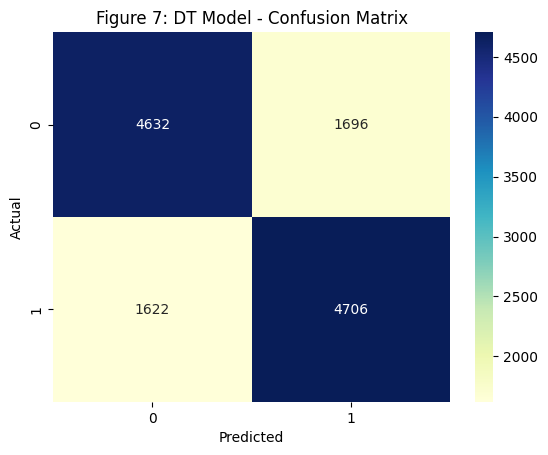

In [ ]:
sns.heatmap(conf_matrix_DT, annot=True, fmt='d', cmap='YlGnBu')
plt.title('Figure 7: DT Model - Confusion Matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

In [ ]:
# predicted_probs_DT = cross_val_predict(model_for_dt, X_DT_train, y_resampled, cv=5)

# # Calculate ROC-AUC
# roc_auc_DT = roc_auc_score(y_resampled, predicted_probs_DT)

# # Calculate ROC curve
# fpr_DT, tpr_DT, _ = roc_curve(y_resampled, predicted_probs_DT)

# # Plot ROC curve
# plt.figure(figsize=(8, 6))
# plt.plot(fpr_DT, tpr_DT, label=f'ROC Curve (AUC = {roc_auc_DT:.2f})')
# plt.plot([0, 1], [0, 1], 'k--', lw=2)
# plt.xlabel('False Positive Rate')
# plt.ylabel('True Positive Rate')
# plt.title('Figure 8A: DT Model - (ROC) Curve')
# plt.legend(loc='lower right')
# plt.show()

#see below - KOnrad

Test ROC-AUC: 0.8500


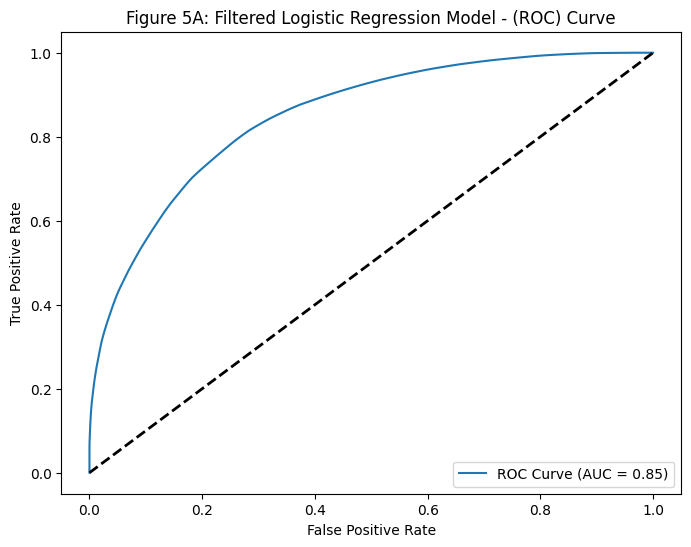

In [ ]:
predicted_probs_DT = model_for_dt.predict_proba(X_DT_train)[:, 1]  # probability of 1 (outcome)

# Calculate ROC-AUC on the train set
roc_auc_train_DT = roc_auc_score(y_resampled, predicted_probs_DT)
print(f"Test ROC-AUC: {roc_auc_train_DT:.4f}")

# Calculate ROC curve on the train set
fpr_DT, tpr_DT, _ = roc_curve(y_resampled, predicted_probs_DT)


# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_DT, tpr_DT, label=f'ROC Curve (AUC = {roc_auc_train_DT:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Figure 5A: Filtered Decision Tree- (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


In [ ]:
# Making predictions on the test set of the DT model
y_pred_test_DT = model_for_dt.predict(X_DT_test)

# Calculating metrics
accuracy_test_DT = accuracy_score(y_test, y_pred_test_DT)
precision_test_DT = precision_score(y_test, y_pred_test_DT)
recall_test_DT = recall_score(y_test, y_pred_test_DT)
f1_test_DT = f1_score(y_test, y_pred_test_DT)
conf_matrix_test_DT = confusion_matrix(y_test, y_pred_test_DT)

# Printing the evaluation metrics
print("Table 2B: DT Model - Test Set- Confusion Matrix/Classification Report")
print("Accuracy: {:.2f}".format(accuracy_test_DT))
print("Precision: {:.2f}".format(precision_test_DT))
print("Recall (Sensitivity): {:.2f}".format(recall_test_DT))
print("F1 Score: {:.2f}".format(f1_test_DT))
print("Confusion Matrix:")
print(conf_matrix_test_DT)

Table 2B: DT Model - Test Set- Confusion Matrix/Classification Report
Accuracy: 0.72
Precision: 0.20
Recall (Sensitivity): 0.78
F1 Score: 0.32
Confusion Matrix:
[[11945  4811]
 [  355  1232]]


In [ ]:
# Making predictions on the test set of the DT model
predicted_probs_test_DT = model_for_dt.predict_proba(X_DT_test)[:, 1]

# Calculate ROC-AUC on the test set
roc_auc_test_DT = roc_auc_score(y_test, predicted_probs_test_DT)
print(f"Test ROC-AUC: {roc_auc_test_DT:.4f}")

# Calculate ROC curve on the test set
fpr_test_DT, tpr_test_DT, _ = roc_curve(y_test, predicted_probs_test_DT)

# Plot ROC curve for the test set
plt.figure(figsize=(8, 6))
plt.plot(fpr_test_DT, tpr_test_DT, label=f'Test ROC Curve (AUC = {roc_auc_test_DT:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Figure 8B: Test Set - DT Model - (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

It seems the Decesion Tree is performing in the same capacity of Logistic Regression. Accuracy and recall scores on unseen (test) data is 0.76 and 0.77 respectively. AUC of the application of the model on the unseen is 0.85 which is an increase of nine points, compared to the AUC of the application of the model on the training data. Yet, similar to logistic regression, when the model was fit to the unseen data, F1 score and precision dropped significantly. Further application of Random Forests might provide better prediction capacities.

**Section 5: Random Forest**

**5.1 Application of RFECV and RFE to obtain important features for Random Forest**

In [ ]:
RF_model = RandomForestClassifier()

cv_RF = StratifiedKFold(5)
rfecv_RF = RFECV(
    estimator=RF_model,
    step=1,
    cv=cv_RF,
    scoring=recall_scoring,
    min_features_to_select=1,
)

rfecv_RF.fit(X_resampled, y_resampled)

# Print the optimal number of selected features
print(f"Optimal number of features -RF: {rfecv_RF.n_features_}")

KeyboardInterrupt: ignored

In [ ]:
# Calculate the number of different feature selections tested
n_scores_RF = len(rfecv_RF.cv_results_["mean_test_score"])

# Create a new figure for plotting
plt.figure()

# Set labels for the x and y axes
plt.xlabel("Number of features selected")
plt.ylabel("Mean test score")

# Plot the mean test scores with error bars
plt.errorbar(
    range(1, n_scores_RF + 1),
    rfecv_RF.cv_results_["mean_test_score"],
    yerr=rfecv_RF.cv_results_["std_test_score"],
    color='#995687'  # Change the color to green
)

# Set the title for the plot
plt.title("Figure 9: Recursive Feature Elimination - RF")

# Show the plot
plt.show()

In [ ]:
selected_RF_features = X_resampled.columns[rfecv_RF.support_]

print("Selected Features for RF:")
print(selected_RF_features)

Selected Features for RF:
Index(['one_hot_encoder__apache_3j_bodysystem_Cardiovascular',
       'one_hot_encoder__apache_3j_bodysystem_Gastrointestinal',
       'one_hot_encoder__apache_3j_bodysystem_Metabolic',
       'one_hot_encoder__apache_3j_bodysystem_Neurological',
       'one_hot_encoder__apache_3j_bodysystem_Respiratory',
       'one_hot_encoder__apache_3j_bodysystem_Sepsis',
       'one_hot_encoder__apache_3j_bodysystem_Trauma',
       'one_hot_encoder__apache_2_bodysystem_Cardiovascular',
       'one_hot_encoder__apache_2_bodysystem_Gastrointestinal',
       'one_hot_encoder__apache_2_bodysystem_Metabolic',
       ...
       'remainder__d1_sodium_min', 'remainder__d1_wbc_max',
       'remainder__d1_wbc_min', 'remainder__apache_4a_hospital_death_prob',
       'remainder__apache_4a_icu_death_prob', 'remainder__cirrhosis',
       'remainder__diabetes_mellitus', 'remainder__hepatic_failure',
       'remainder__immunosuppression',
       'remainder__solid_tumor_with_metastasis'],

In [ ]:
# Accessing the mean test scores
mean_test_scores_RF = rfecv_RF.cv_results_["mean_test_score"]

# Printing the list of mean test scores along with the number of selected features
for r, score_RF in enumerate(mean_test_scores_RF):
    RF_selected_features = r + 1  #start with one feature
    print(f"Number of Selected Features: {RF_selected_features}, Mean Test Score: {score_RF}")

Number of Selected Features: 1, Mean Test Score: 0.5586490081111964
Number of Selected Features: 2, Mean Test Score: 0.708752973793155
Number of Selected Features: 3, Mean Test Score: 0.7386199102086183
Number of Selected Features: 4, Mean Test Score: 0.7522120025726042
Number of Selected Features: 5, Mean Test Score: 0.7604305990046769
Number of Selected Features: 6, Mean Test Score: 0.7637472603637863
Number of Selected Features: 7, Mean Test Score: 0.7763882384529406
Number of Selected Features: 8, Mean Test Score: 0.7743334020193695
Number of Selected Features: 9, Mean Test Score: 0.772597268793436
Number of Selected Features: 10, Mean Test Score: 0.7767063172420683
Number of Selected Features: 11, Mean Test Score: 0.7763896121736632
Number of Selected Features: 12, Mean Test Score: 0.7835004901685305
Number of Selected Features: 13, Mean Test Score: 0.7828700772405697
Number of Selected Features: 14, Mean Test Score: 0.7849226657675039
Number of Selected Features: 15, Mean Test Sc



While the application of rfecv here suggests that the optimal number of variables to inlcude in a Random Forest model is 111, the mean test score does not significantly increase after 22 features. In this case, RFE will be used where selection of features will be set to 22. This approach would remove the least important features, based on gini impurity

In [ ]:
rfe_RF = RFE(RF_model, n_features_to_select=22)
rfe_RF.fit(X_resampled, y_resampled)

#extracting features
most_important_features_RF = X_resampled.columns[rfe_RF.support_]

In [ ]:
most_important_features_RF

Index(['remainder__age', 'remainder__bmi', 'remainder__weight',
       'remainder__apache_3j_diagnosis', 'remainder__ventilated_apache',
       'remainder__d1_heartrate_max', 'remainder__d1_heartrate_min',
       'remainder__d1_mbp_noninvasive_min', 'remainder__d1_resprate_max',
       'remainder__d1_spo2_min', 'remainder__d1_sysbp_max',
       'remainder__d1_sysbp_min', 'remainder__d1_sysbp_noninvasive_min',
       'remainder__d1_temp_min', 'remainder__d1_bun_max',
       'remainder__d1_bun_min', 'remainder__d1_creatinine_max',
       'remainder__d1_creatinine_min', 'remainder__d1_platelets_min',
       'remainder__d1_wbc_min', 'remainder__apache_4a_hospital_death_prob',
       'remainder__apache_4a_icu_death_prob'],
      dtype='object')

**5.2 Hyperparametre tunning for Random Forest**

In [ ]:
RF_features = ['remainder__age', 'remainder__bmi', 'remainder__weight',
       'remainder__apache_3j_diagnosis', 'remainder__ventilated_apache',
       'remainder__d1_heartrate_max', 'remainder__d1_heartrate_min',
       'remainder__d1_mbp_noninvasive_min', 'remainder__d1_resprate_max',
       'remainder__d1_spo2_min', 'remainder__d1_sysbp_max',
       'remainder__d1_sysbp_min', 'remainder__d1_sysbp_noninvasive_min',
       'remainder__d1_temp_min', 'remainder__d1_bun_max',
       'remainder__d1_bun_min', 'remainder__d1_creatinine_max',
       'remainder__d1_creatinine_min', 'remainder__d1_platelets_min',
       'remainder__d1_wbc_min', 'remainder__apache_4a_hospital_death_prob',
       'remainder__apache_4a_icu_death_prob']

In [ ]:
#fitting data
X_RF_train = X_resampled[RF_features]
X_RF_test = X_test[RF_features]

In [ ]:
# Initializing a Random Forest classifier
#we already have balanced class through the previous undersampling step
#thus, class weight will be set to none instead of balanced
rf = RandomForestClassifier(criterion='entropy', class_weight=None)

# Creating a pipeline that applies the Random Forest
model_for_rf = Pipeline([
    ('random_forest', rf)
])

# Fitting the model on the training data
model_for_rf.fit(X_RF_train, y_resampled)

Pipeline(steps=[('random_forest', RandomForestClassifier(criterion='entropy'))])

In [ ]:
# Define the hyperparameter values that should be tested
param_dist_RF = {
    "random_forest__n_estimators" : [200],
    "random_forest__max_depth" : [5, 10, 15, 20, 25, 30],
    "random_forest__min_samples_leaf" : [15, 20 ,2, 30, 35, 40],
    "random_forest__max_features" : ['sqrt']
}

# Setting up Stratified K-Fold cross-validation
skf = StratifiedKFold(n_splits=5)

# Initialize Grid Search with the model and the hyperparameters to search
random_search_RF = GridSearchCV(
    model_for_rf, param_grid=param_dist_RF, cv=skf)

# Train Grid Search on the training data
random_search_RF.fit(X_RF_train, y_resampled)

# Extract results into a DataFrame
results_RF = pd.DataFrame(random_search_RF.cv_results_)

# Display the set of parameters that achieved the best score
results_RF[results_RF['rank_test_score'] == 1]

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_random_forest__max_depth,param_random_forest__max_features,param_random_forest__min_samples_leaf,param_random_forest__n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
32,6.957941,1.034465,0.118767,0.013765,30,sqrt,2,200,"{'random_forest__max_depth': 30, 'random_fores...",0.795024,0.798104,0.807981,0.792967,0.809957,0.800806,0.006891,1


Hyperparameters for the Random Forest classifier are fine-tuned using Grid Search. Grid Search evaluates the model performance for each combination of the hyperparameters provided. After the search, results are saved in a DataFrame, and the row with the best-performing hyperparameters is filtered out for review.

In [ ]:
# Retrieve the best hyperparameters after Grid Search for RF
random_search_RF.best_params_

{'random_forest__max_depth': 30,
 'random_forest__max_features': 'sqrt',
 'random_forest__min_samples_leaf': 2,
 'random_forest__n_estimators': 200}

**5.3 Developing a Random Forest model**

In [ ]:
# Update the model's hyperparameters to the best found during Grid Search
model_for_rf = model_for_rf.set_params(**random_search_RF.best_params_)

# Refit the model using the training data
model_for_rf = model_for_rf.fit(X_RF_train, y_resampled)

NameError: ignored

In [ ]:
# Using cross_val_predict to get predicted labels for each fold of cross-validation
predicted_labels_RF_model = cross_val_predict(model_for_rf, X_RF_train, y_resampled, cv=5)

# Calculating the full confusion matrix
conf_matrix_RF = confusion_matrix(y_resampled, predicted_labels_RF_model)

# Calculate the full classification report
class_report_RF = classification_report(y_resampled, predicted_labels_RF_model)

# Calculate accuracy
accuracy_RF = accuracy_score(y_resampled, predicted_labels_RF_model)

# Calculate precision
precision_RF = precision_score(y_resampled, predicted_labels_RF_model)

# Calculate recall
recall_RF = recall_score(y_resampled, predicted_labels_RF_model)

# Calculate F1 score
f1_RF = f1_score(y_resampled, predicted_labels_RF_model)


# Print the full confusion matrix and classification report
print("Table 3A: RF Model Confusion Matrix/Classification Report")
print("A. Confusion Matrix:")
print(conf_matrix_RF)
print("B. Classification Report:")
print(class_report_RF)
print("C. Accuracy: {:.2f}".format(accuracy_RF))
print("D. Precision: {:.2f}".format(precision_RF))
print("E. Recall (Sensitivity): {:.2f}".format(recall_RF))
print("F. F1 Score: {:.2f}".format(f1_RF))

Table 3A: RF Model Confusion Matrix/Classification Report
A. Confusion Matrix:
[[5086 1242]
 [1277 5051]]
B. Classification Report:
              precision    recall  f1-score   support

           0       0.80      0.80      0.80      6328
           1       0.80      0.80      0.80      6328

    accuracy                           0.80     12656
   macro avg       0.80      0.80      0.80     12656
weighted avg       0.80      0.80      0.80     12656

C. Accuracy: 0.80
D. Precision: 0.80
E. Recall (Sensitivity): 0.80
F. F1 Score: 0.80


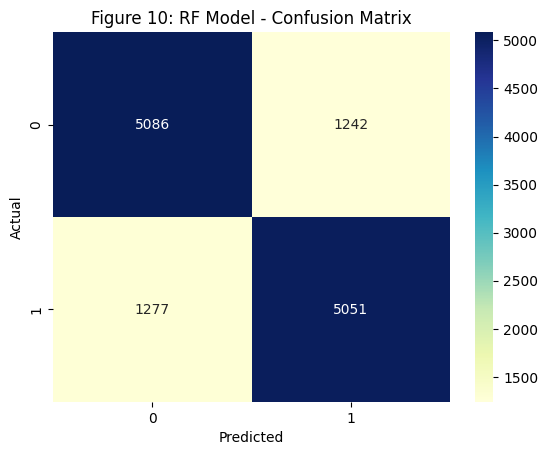

In [ ]:
sns.heatmap(conf_matrix_RF, annot=True, fmt='d', cmap='YlGnBu')
plt.title('Figure 10: RF Model - Confusion Matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

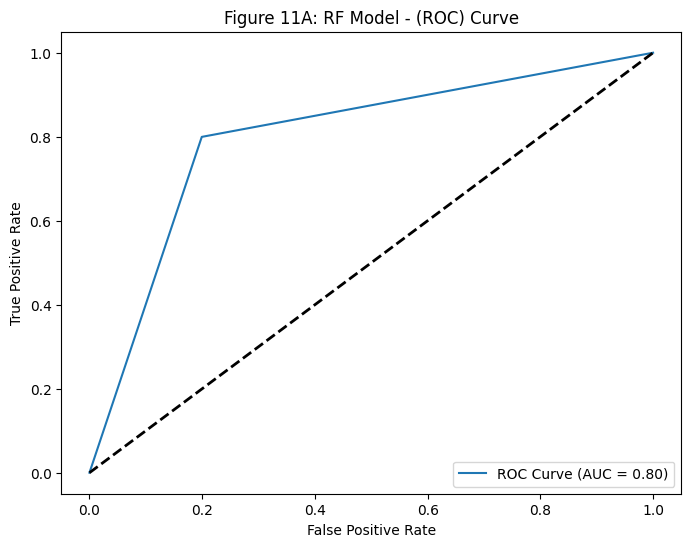

In [ ]:
# predicted_probs_RF = cross_val_predict(model_for_rf, X_RF_train, y_resampled, cv=5)

# # Calculate ROC-AUC
# roc_auc_RF = roc_auc_score(y_resampled, predicted_probs_RF)

# # Calculate ROC curve
# fpr_RF, tpr_RF, _ = roc_curve(y_resampled, predicted_probs_RF)

# # Plot ROC curve
# plt.figure(figsize=(8, 6))
# plt.plot(fpr_RF, tpr_RF, label=f'ROC Curve (AUC = {roc_auc_RF:.2f})')
# plt.plot([0, 1], [0, 1], 'k--', lw=2)
# plt.xlabel('False Positive Rate')
# plt.ylabel('True Positive Rate')
# plt.title('Figure 11A: RF Model - (ROC) Curve')
# plt.legend(loc='lower right')
# plt.show()

#Konrad: corrected below but didnt run yet

In [ ]:
#Konrad: corrected below but didnt run yet, may enounter error.

predicted_probs_RF = model_for_rf.predict_proba(X_RF_train)[:, 1]  # probability of 1 (outcome)

# Calculate ROC-AUC
roc_auc_train_RF = roc_auc_score(y_resampled, predicted_probs_RF)
print(f"Test ROC-AUC: {roc_auc_train_RF:.4f}")

# Calculate ROC curve
fpr_RF, tpr_RF, _ = roc_curve(y_resampled, predicted_probs_RF)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_RF, tpr_RF, label=f'ROC Curve (AUC = {roc_auc_train_RF:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Figure 11A: RF Model - (ROC) Curve')
plt.legend(loc='lower right')
plt.show()



In [ ]:
# Making predictions on the test set of the RF model
y_pred_test_RF = model_for_rf.predict(X_RF_test)

# Calculating metrics
accuracy_test_RF = accuracy_score(y_test, y_pred_test_RF)
precision_test_RF = precision_score(y_test, y_pred_test_RF)
recall_test_RF = recall_score(y_test, y_pred_test_RF)
f1_test_RF = f1_score(y_test, y_pred_test_RF)
conf_matrix_test_RF = confusion_matrix(y_test, y_pred_test_RF)

# Printing the evaluation metrics
print("Table 3B: RF Model - Test Set- Confusion Matrix/Classification Report")
print("Accuracy: {:.2f}".format(accuracy_test_RF))
print("Precision: {:.2f}".format(precision_test_RF))
print("Recall (Sensitivity): {:.2f}".format(recall_test_RF))
print("F1 Score: {:.2f}".format(f1_test_RF))
print("Confusion Matrix:")
print(conf_matrix_test_RF)

Table 3B: RF Model - Test Set- Confusion Matrix/Classification Report
Accuracy: 0.80
Precision: 0.27
Recall (Sensitivity): 0.81
F1 Score: 0.41
Confusion Matrix:
[[13345  3411]
 [  296  1291]]


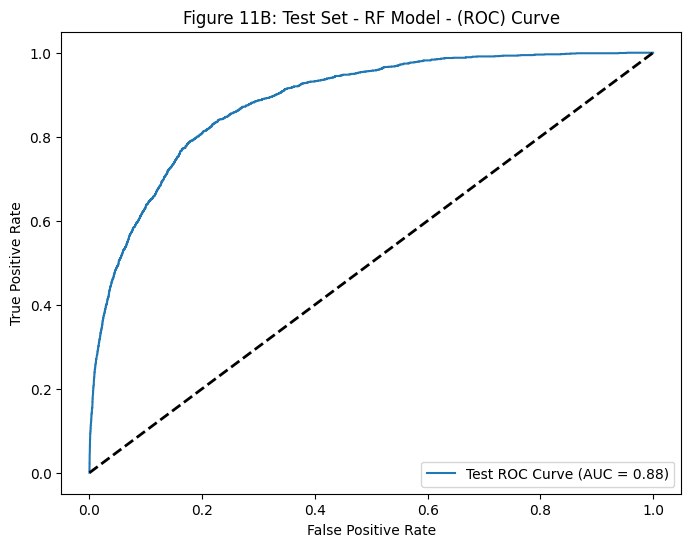

In [ ]:
# Making predictions on the test set of the RF model
predicted_probs_test_RF = model_for_rf.predict_proba(X_RF_test)[:, 1]

# Calculate ROC-AUC on the test set
roc_auc_test_RF = roc_auc_score(y_test, predicted_probs_test_RF)

# Calculate ROC curve on the test set
fpr_test_RF, tpr_test_RF, _ = roc_curve(y_test, predicted_probs_test_RF)

# Plot ROC curve for the test set
plt.figure(figsize=(8, 6))
plt.plot(fpr_test_RF, tpr_test_RF, label=f'Test ROC Curve (AUC = {roc_auc_test_RF:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Figure 11B: Test Set - RF Model - (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

Random Forest is performing better than Decision Tree and Logistic Regression. Accuracy and recall scores on unseen (test) data is 0.80 and 0.81 respectively. These scores are almost similar to the scores of the model when tested on the training set, which indicates that there is no overfitting in the mode. AUC of the application of the model on the unseen is 0.88 which is an increase of eight points, compared to the AUC of the application of the model on the training data. Yet, similar to logistic regression, when the model was fit to the unseen data, F1 score and precision dropped significantly. Further application of AdaBoost might provide better prediction capacities.

**Section 6: XGBoost**

6.1 RFECV with XGBoost Model

note for anyone who runs the below cell: it took >1.5h to complete!

In [ ]:
xgb_model = GradientBoostingClassifier()

cv_xgb = StratifiedKFold(5)

rfecv_xgb = RFECV(
    estimator=xgb_model,
    step=1,
    cv=cv_xgb,
    scoring=recall_scoring,
    min_features_to_select=1,
)

rfecv_xgb.fit(X_resampled, y_resampled)

# Print the optimal number of selected features
print(f"Optimal number of features (XGB): {rfecv_xgb.n_features_}")


Optimal number of features (XGB): 61


In [ ]:
selected_xgb_features = [i for i in X_resampled.columns[rfecv_xgb.support_]]

print("Selected Features for XGB:")
print(selected_xgb_features)

Selected Features for XGB:
['one_hot_encoder__apache_2_bodysystem_Neurologic', 'one_hot_encoder__apache_2_bodysystem_Undefined diagnoses', 'one_hot_encoder__gcs_eyes_apache_1', 'one_hot_encoder__gcs_motor_apache_6', 'one_hot_encoder__gcs_verbal_apache_5', 'remainder__age', 'remainder__bmi', 'remainder__elective_surgery', 'remainder__weight', 'remainder__apache_2_diagnosis', 'remainder__apache_3j_diagnosis', 'remainder__glucose_apache', 'remainder__heart_rate_apache', 'remainder__map_apache', 'remainder__resprate_apache', 'remainder__ventilated_apache', 'remainder__d1_diasbp_min', 'remainder__d1_heartrate_max', 'remainder__d1_heartrate_min', 'remainder__d1_mbp_min', 'remainder__d1_mbp_noninvasive_min', 'remainder__d1_resprate_max', 'remainder__d1_resprate_min', 'remainder__d1_spo2_max', 'remainder__d1_spo2_min', 'remainder__d1_sysbp_max', 'remainder__d1_sysbp_min', 'remainder__d1_sysbp_noninvasive_max', 'remainder__d1_sysbp_noninvasive_min', 'remainder__d1_temp_max', 'remainder__d1_temp

In [ ]:
mean_test_scores_xgb = rfecv_xgb.cv_results_["mean_test_score"]

# Printing the list of mean test scores along with the number of selected features
for t, score_xgb in enumerate(mean_test_scores_xgb):
    xgb_selected_features = t + 1  #start with one feature
    print(f"Number of Selected Features: {xgb_selected_features}, Mean Test Score: {score_xgb}")

Number of Selected Features: 1, Mean Test Score: 0.7242380533128524
Number of Selected Features: 2, Mean Test Score: 0.7166558642264391
Number of Selected Features: 3, Mean Test Score: 0.7528460371279246
Number of Selected Features: 4, Mean Test Score: 0.7664353820504656
Number of Selected Features: 5, Mean Test Score: 0.7732293052095237
Number of Selected Features: 6, Mean Test Score: 0.7760745305933849
Number of Selected Features: 7, Mean Test Score: 0.7789196310935441
Number of Selected Features: 8, Mean Test Score: 0.7849245390230348
Number of Selected Features: 9, Mean Test Score: 0.7857138040200063
Number of Selected Features: 10, Mean Test Score: 0.7868196492016809
Number of Selected Features: 11, Mean Test Score: 0.7906119925819082
Number of Selected Features: 12, Mean Test Score: 0.7898208543294057
Number of Selected Features: 13, Mean Test Score: 0.7915599847641884
Number of Selected Features: 14, Mean Test Score: 0.7934562188961529
Number of Selected Features: 15, Mean Test 

RFECV indicates optimal number of features is 61, mean test score does not appear to increase past 0.80 starting at 27 features, so initially this appears to be the optimal value in this case.

In [ ]:
#setting parametres
rfe_xgb = RFE(xgb_model, n_features_to_select=27)
rfe_xgb.fit(X_resampled, y_resampled)

#extracting features
xgb_features = X_resampled.columns[rfe_xgb.support_]

print(xgb_features)

Index(['remainder__age', 'remainder__bmi', 'remainder__apache_2_diagnosis',
       'remainder__apache_3j_diagnosis', 'remainder__resprate_apache',
       'remainder__ventilated_apache', 'remainder__d1_heartrate_max',
       'remainder__d1_heartrate_min', 'remainder__d1_mbp_min',
       'remainder__d1_resprate_max', 'remainder__d1_resprate_min',
       'remainder__d1_spo2_min', 'remainder__d1_sysbp_max',
       'remainder__d1_sysbp_min', 'remainder__d1_sysbp_noninvasive_min',
       'remainder__d1_temp_min', 'remainder__h1_resprate_min',
       'remainder__d1_bun_max', 'remainder__d1_bun_min',
       'remainder__d1_creatinine_max', 'remainder__d1_hco3_max',
       'remainder__d1_hco3_min', 'remainder__d1_platelets_min',
       'remainder__d1_sodium_max', 'remainder__d1_wbc_min',
       'remainder__apache_4a_hospital_death_prob',
       'remainder__apache_4a_icu_death_prob'],
      dtype='object')


In [ ]:
xgb_features_list = ['remainder__age', 'remainder__bmi', 'remainder__apache_2_diagnosis',
       'remainder__apache_3j_diagnosis', 'remainder__resprate_apache',
       'remainder__ventilated_apache', 'remainder__d1_heartrate_max',
       'remainder__d1_heartrate_min', 'remainder__d1_mbp_min',
       'remainder__d1_resprate_max', 'remainder__d1_resprate_min',
       'remainder__d1_spo2_min', 'remainder__d1_sysbp_max',
       'remainder__d1_sysbp_min', 'remainder__d1_sysbp_noninvasive_min',
       'remainder__d1_temp_min', 'remainder__h1_resprate_min',
       'remainder__d1_bun_max', 'remainder__d1_bun_min',
       'remainder__d1_creatinine_max', 'remainder__d1_hco3_max',
       'remainder__d1_hco3_min', 'remainder__d1_platelets_min',
       'remainder__d1_sodium_max', 'remainder__d1_wbc_min',
       'remainder__apache_4a_hospital_death_prob',
       'remainder__apache_4a_icu_death_prob']

In [ ]:
X_resampled_xgb = X_resampled[xgb_features_list]
X_test_xgb = X_test[xgb_features_list]

6.2 Hyperparameter tuning using GridSearchCV

In [ ]:
# Initializing the Gradient Boosting model with initial parameters
random_forest_xgb = GradientBoostingClassifier()

# Creating a pipeline that first applies the column transformations and then runs the Gradient Boosting model
model_xgb = Pipeline([
    ('xg_boost', random_forest_xgb)
])

In [ ]:
### Hyperparameter tuning using GridSearchCV
param_dist_xgb = {
    "xg_boost__n_estimators" : [100, 200],
    "xg_boost__max_depth" : [1, 5],
    "xg_boost__min_samples_leaf" : [25],
    "xg_boost__learning_rate" : [.1,  .2]
}

# Using StratifiedKFold for cross-validation, ensuring each fold has the same proportion of observations with each target value
skf = StratifiedKFold(n_splits=5)

# Setting up the GridSearchCV to find the best hyperparameters for the Gradient Boosting model
random_search_xgb = GridSearchCV(
    model_xgb, param_grid=param_dist_xgb, cv=skf
)

# Fitting the GridSearchCV on the training data
random_search_xgb.fit(X_resampled_xgb, y_resampled)

# Storing and displaying the results of the grid search
results_xgb = pd.DataFrame(random_search_xgb.cv_results_)
results_xgb[results_xgb['rank_test_score'] == 1]

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_xg_boost__learning_rate,param_xg_boost__max_depth,param_xg_boost__min_samples_leaf,param_xg_boost__n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
2,8.651718,2.143536,0.016109,0.00955,0.1,5,25,100,"{'xg_boost__learning_rate': 0.1, 'xg_boost__ma...",0.808057,0.800079,0.810747,0.813512,0.812722,0.809023,0.004853,1


6.3 Cross-validation using XGBoost Model

In [ ]:
kf = StratifiedKFold(n_splits = 5)
k = 5
fold = 1

total_validation_loss_xgb=0

for train_index, valid_index in kf.split(X_resampled_xgb, y_resampled):
    X_train_data, X_valid_data = pd.DataFrame(X_resampled.iloc[train_index]), pd.DataFrame(X_resampled.iloc[valid_index])
    y_train_data, y_valid_data = pd.DataFrame(y_resampled.iloc[train_index]), pd.DataFrame(y_resampled.iloc[valid_index])


    xgboost = model_xgb.set_params(**random_search_xgb.best_params_)

    # Fitting model to training data
    model = xgboost.fit(X_train_data, y_train_data)

    # Predicting on the training dataset and computing the accuracy
    Y_pred = model.predict(X_train_data)
    accuracy = accuracy_score(y_train_data, Y_pred)

    # Predicting on the validation data and computing the accuracy
    Y_pred_valid = model.predict(X_valid_data)
    accuracy_score_valid = accuracy_score(y_valid_data, Y_pred_valid)

    print("Fold:", fold)
    fold += 1

    print("Accuracy Score:", accuracy_score_valid)

    conf_matrix = confusion_matrix(y_valid_data, Y_pred_valid)
    print("Confusion Matrix:\n", conf_matrix)

    class_report = classification_report(y_valid_data, Y_pred_valid)
    print("Classification Report:\n", class_report)

    total_validation_loss_xgb+=accuracy_score_valid


total_validation_loss_xgb /= k
print("Total Validation Loss:", total_validation_loss_xgb)

Fold: 1
Accuracy Score: 0.8096366508688784
Confusion Matrix:
 [[1019  247]
 [ 235 1031]]
Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.80      0.81      1266
           1       0.81      0.81      0.81      1266

    accuracy                           0.81      2532
   macro avg       0.81      0.81      0.81      2532
weighted avg       0.81      0.81      0.81      2532

Fold: 2
Accuracy Score: 0.7953378111418412
Confusion Matrix:
 [[1019  247]
 [ 271  994]]
Classification Report:
               precision    recall  f1-score   support

           0       0.79      0.80      0.80      1266
           1       0.80      0.79      0.79      1265

    accuracy                           0.80      2531
   macro avg       0.80      0.80      0.80      2531
weighted avg       0.80      0.80      0.80      2531

Fold: 3
Accuracy Score: 0.8087712366653497
Confusion Matrix:
 [[1020  246]
 [ 238 1027]]
Classification Report:
        

6.4 Testing XGBoost on Test Data

In [ ]:
xgboost = model_xgb.set_params(**random_search_xgb.best_params_)
xgb_model = xgboost.fit(X_resampled_xgb, y_resampled)

# Predicting on the train data and computing the accuracy
Y_pred_xgb_train = xgb_model.predict(X_resampled_xgb)
accuracy_train_xgb = accuracy_score(y_resampled, Y_pred_xgb_train)
precision_xgb_train = precision_score(y_resampled, Y_pred_xgb_train)
recall_xgb_train = recall_score(y_resampled, Y_pred_xgb_train)
f1_xgb_train = f1_score(y_resampled, Y_pred_xgb_train)

# Predicting on the test data and computing the accuracy
Y_pred_xgb_test = xgb_model.predict(X_test_xgb)
accuracy_test_xgb = accuracy_score(y_test, Y_pred_xgb_test)

print("Test Data Performance")
print("Accuracy Score:", accuracy_test_xgb)

conf_matrix_xgb = confusion_matrix(y_test, Y_pred_xgb_test)
print("Confusion Matrix:\n", conf_matrix_xgb)

class_report_xgb = classification_report(y_test, Y_pred_xgb_test)
print("Classification Report:\n", class_report_xgb)

precision_xgb_test = precision_score(y_test, Y_pred_xgb_test)
print("Precision:", precision_xgb_test)

recall_xgb_test = recall_score(y_test, Y_pred_xgb_test)
print("Recall:", recall_xgb_test)

f1_xgb_test = f1_score(y_test, Y_pred_xgb_test)
print("F1 Score:", f1_xgb_test)



Test Data Performance
Accuracy Score: 0.8026495120754511
Confusion Matrix:
 [[13433  3323]
 [  297  1290]]
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.80      0.88     16756
           1       0.28      0.81      0.42      1587

    accuracy                           0.80     18343
   macro avg       0.63      0.81      0.65     18343
weighted avg       0.92      0.80      0.84     18343

Precision: 0.2796444829828745
Recall: 0.8128544423440454
F1 Score: 0.4161290322580644


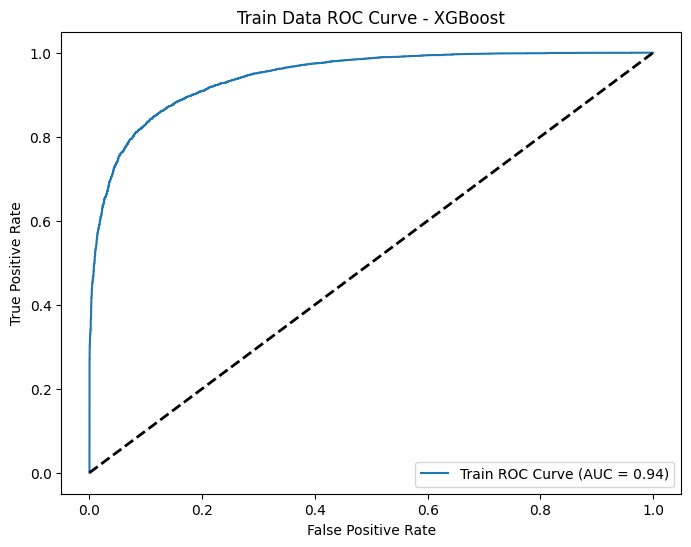

In [ ]:
### ROC Curve - Train Data
predicted_probs_train_xgb = model_xgb.predict_proba(X_resampled_xgb)[:, 1]
fpr_xgb_train, tpr_xgb_train, thresholds_xgb_train = roc_curve(y_resampled, predicted_probs_train_xgb)
roc_auc_xgb_train = roc_auc_score(y_resampled, predicted_probs_train_xgb)

plt.figure(figsize=[8,6])
plt.plot(fpr_xgb_train, tpr_xgb_train, label=f'Train ROC Curve (AUC = {roc_auc_xgb_train:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.title("Train Data ROC Curve - XGBoost")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc='lower right')
plt.show()

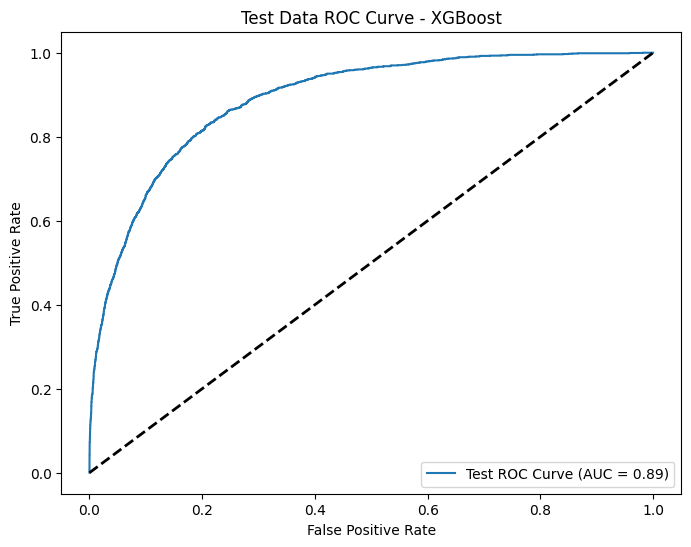

In [ ]:
#### ROC Curve - Test Data
predicted_probs_test_xgb = model_xgb.predict_proba(X_test_xgb)[:, 1]
fpr_xgb_test, tpr_xgb_test, thresholds_xgb_test = roc_curve(y_test, predicted_probs_test_xgb)
roc_auc_xgb_test = roc_auc_score(y_test, predicted_probs_test_xgb)

plt.figure(figsize=[8,6])
plt.plot(fpr_xgb_test, tpr_xgb_test, label=f'Test ROC Curve (AUC = {roc_auc_xgb_test:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.title("Test Data ROC Curve - XGBoost")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc='lower right')
plt.show()

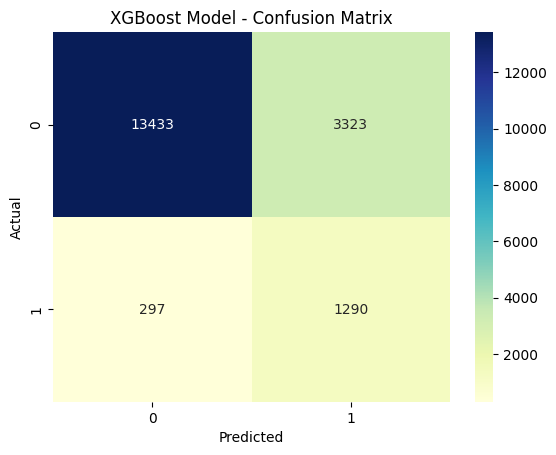

In [ ]:
sns.heatmap(conf_matrix_xgb, annot=True, fmt='d', cmap='YlGnBu')
plt.title('XGBoost Model - Confusion Matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

**Section 7: Adaboost**

**Section 8: Summary**

**8.1 Evaluations**

In [ ]:
# setting evaluations
evaluations = {
    'Model': ['LR Training', 'LR Test', 'DT Training', 'DT Test', 'RF Training', 'RF Test'],
    'Accuracy': [accuracy_LR, accuracy_test_LR, accuracy_DT, accuracy_test_DT, accuracy_RF, accuracy_test_RF, accuracy_train_xgb, accuracy_test_xgb],
    'Precision': [precision_LR, precision_test_LR, precision_DT, precision_test_DT, precision_RF, precision_test_RF, precision_xgb_train, precision_xgb_test],
    'Recall (Sensitivity)': [recall_LR, recall_test_LR, recall_DT, recall_test_DT, recall_RF, recall_test_RF, recall_xgb_train, recall_xgb_test],
    'F1 Score': [f1_LR, f1_test_LR, f1_DT, f1_test_DT, f1_RF, f1_test_RF, f1_xgb_train, f1_xgb_test]
}

# Creating a DataFrame
results_summary = pd.DataFrame(evaluations)

# Displaying the combined evaluation results
print(results_summary)

         Model  Accuracy  Precision  Recall (Sensitivity)  F1 Score
0  LR Training  0.787137   0.794299              0.774968  0.784514
1      LR Test  0.792073   0.263236              0.780088  0.393641
2  DT Training  0.765250   0.761816              0.771808  0.766779
3      DT Test  0.758982   0.232843              0.778198  0.358439
4  RF Training  0.800964   0.802638              0.798198  0.800412
5      RF Test  0.797907   0.274564              0.813485  0.410558


**8.2 ROC curves**

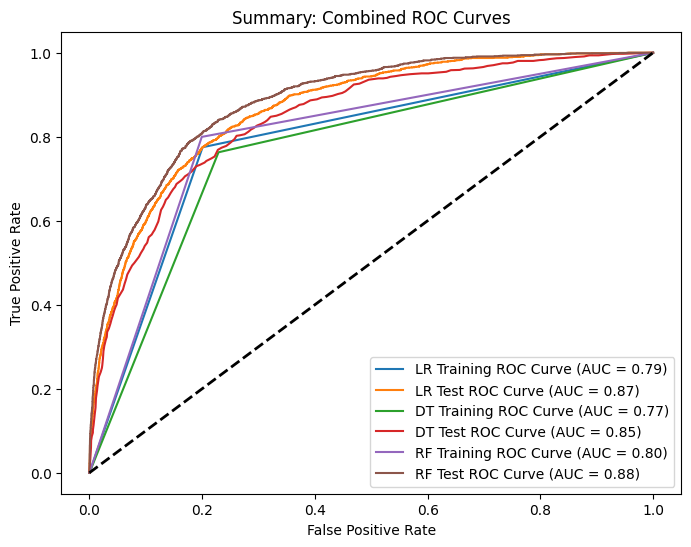

In [ ]:
fig, (ax1, ax2) = plt.subplots(figsize=[15,20])

# Creating a figure
plt.figure(figsize=(8, 6))

# Plotting the ROC curves for training sets (all models)
ax1.set_title('Summary: ROC Curves for Training Sets')
ax1.plot(fpr_LR, tpr_LR, label=f'LR (AUC = {roc_auc_LR:.2f})')
ax1.plot(fpr_DT, tpr_DT, label=f'DT (AUC = {roc_auc_DT:.2f})')
ax1.plot(fpr_RF, tpr_RF, label=f'RF (AUC = {roc_auc_RF:.2f})')
ax1.plot(fpr_xgb_train, tpr_xgb_train, label=f'RF (AUC = {roc_auc_xgb_train:.2f})')
ax1.plot([0, 1], [0, 1], 'k--', lw=2) # Plotting the diagonal line (random classifier)
ax1.set_xlabel('False Positive Rate')
ax1.set_ylabel('True Positive Rate')
ax1.legend(loc='lower right')


# Plotting the ROC curves for test sets (all models)
ax2.set_title('Summary: Combined ROC Curves for Test Sets')
ax2.plot(fpr_test_LR, tpr_test_LR, label=f'LR (AUC = {roc_auc_test_LR:.2f})')
ax2.plot(fpr_test_DT, tpr_test_DT, label=f'DT (AUC = {roc_auc_test_DT:.2f})')
ax2.plot(fpr_test_RF, tpr_test_RF, label=f'RF (AUC = {roc_auc_test_RF:.2f})')
ax2.plot(fpr_xgb_test, tpr_xgb_test, label=f'RF (AUC = {roc_auc_xgb_test:.2f})')
ax2.plot([0, 1], [0, 1], 'k--', lw=2) # Plotting the diagonal line (random classifier)
ax2.set_xlabel('False Positive Rate')
ax2.set_ylabel('True Positive Rate')
ax2.legend(loc='lower right')

# Display the graph
plt.show()


In [ ]:
#REVISED GRAPHIC CODE - DIDNT RUN YET

plt.figure(figsize=(8, 6))

# Plotting the ROC curves for test sets (all models)
plt.plot(fpr_test_LR, tpr_test_LR, label=f'LR (AUC = {roc_auc_test_LR:.2f})')
plt.plot(fpr_test_DT, tpr_test_DT, label=f'DT (AUC = {roc_auc_test_DT:.2f})')
plt.plot(fpr_test_RF, tpr_test_RF, label=f'RF (AUC = {roc_auc_test_RF:.2f})')
plt.plot(fpr_xgb_test, tpr_xgb_test, label=f'XGB (AUC = {roc_auc_xgb_test:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)  # Plotting the diagonal line (random classifier)

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Summary: Combined ROC Curves for Test Sets')
plt.legend(loc='lower right')

# Display the graph
plt.show()

8.3 Most Important Features by Model

In [ ]:
print("Number of Selected Features by Model")
features_table_summary = pd.DataFrame(columns=["Model", "Number of Features"])
features_table_summary.loc[len(features_table_summary)] = "LR", len(LR_features)
features_table_summary.loc[len(features_table_summary)] = "DT", len(DT_features)
features_table_summary.loc[len(features_table_summary)] = "RF", len(RF_features)
features_table_summary.loc[len(features_table_summary)] = "XGB", len(xgb_features_list)
print(features_table_summary)

Table of Selected Features by Model
  Model  Number of Features                                           Features
0    LR                  24  [one_hot_encoder__apache_3j_bodysystem_Metabol...
1    DT                  13  [remainder__bmi, remainder__apache_3j_diagnosi...
2    RF                  22  [remainder__age, remainder__bmi, remainder__we...
3   XGB                  27  [remainder__age, remainder__bmi, remainder__ap...


'counts, edges, bars = plt.hist(x+y, bins=2, rwidth=0.8)\nplt.bar_label(bars)\nplt.xticks(ticks=[0.25, 0.75], labels=[0, 1])\nplt.title("Most Common Important Features")\nplt.show()'

In [ ]:
counted = dict(Counter(LR_features+DT_features+RF_features+xgb_features_list))
overall_features = [i for i in counted.keys()]
overall_counts = [i for i in counted.values()]

print(f"The following variables were used most frequently:")
for i in range(len(overall_counts)):
  if overall_counts[i] == max(overall_counts):
    print(overall_features[i])

The following variables were used most frequently:
remainder__d1_heartrate_max
remainder__apache_4a_hospital_death_prob
